In [1]:
import xarray as xr
import warnings
# ignore MatplotlibDeprecationWarning
warnings.filterwarnings("ignore")

from scipy.stats import linregress
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import cartopy.crs as ccrs
import cartopy.feature as cfeature
from scipy import stats
from scipy.stats import ttest_ind
import geopandas as gpd
import rioxarray
from shapely.geometry import mapping
import os
from scipy.stats.stats import pearsonr
from glob import glob

os.chdir('/Volumes/Seagate_ZQ2/SWE_datasets/rawData')

In [2]:
def _compute_slope(var):
    if np.isnan(var).all():
        slp = np.nan
    else:
        slp = linregress(range(len(var)),var).slope
    return slp

def _compute_trend_pval(var):
    if np.isnan(var).all():
        pval = np.nan
    else:
        pval = linregress(range(len(var)),var).pvalue
    return pval
    
def trend_cal(data):
    slopes = xr.apply_ufunc(_compute_slope,
                            data,
                            vectorize=True,
                            dask='parallelized', 
                            input_core_dims=[['year']],
                            output_dtypes=[float],
                            )
    return slopes

def trend_cal_pval(data):
    pvals = xr.apply_ufunc(_compute_trend_pval,
                            data,
                            vectorize=True,
                            dask='parallelized', 
                            input_core_dims=[['year']],
                            output_dtypes=[float],
                            )
    return pvals

def add_panel_label(ax, label, x = 0, y = 1.1):
    ax.text(x, y, label, transform=ax.transAxes,
      fontsize=14, fontweight='bold', va='top', ha='left')

In [3]:
dataset_names = ['ERA5','ERA5_Land','CFSR','JRA55','HARv2','TerraClimate','FLDAS_NOAH_M','GLDAS_CLSM_M','GLDAS_NOAH_M','GLDAS_VIC_M']
dataset_monthly_paths = {dn:glob(dn + '/' + dn + '_SWE_monthly*.nc')[0] for dn in dataset_names}
dataset_time_spans = {
    'ERA5':[1979,2023],
    'ERA5_Land':[1979,2023],
    'CFSR':[1979,2023],
    'JRA55':[1979,2023],
    'HARv2':[1980,2022],
    'TerraClimate':[1979,2022],
    'FLDAS_NOAH_M':[2000,2023],
    'GLDAS_CLSM_M':[2000,2023],
    'GLDAS_NOAH_M':[2000,2023],
    'GLDAS_VIC_M':[2000,2023],
    }
dataset_var_names = {
    'ERA5':'SWE',
    'ERA5_Land':'SWE',
    'CFSR':'WEASD_L1_Avg',
    'JRA55':'SWE',
    'HARv2':'snow',
    'TerraClimate':'swe',
    'FLDAS_NOAH_M':'SWE_inst',
    'GLDAS_CLSM_M':'SWE_inst', # ****
    'GLDAS_NOAH_M':'SWE_inst',
    'GLDAS_VIC_M':'SWE_inst',
    }
dataset_units = {
    'ERA5':'m of water equivalent',
    'ERA5_Land':'m of water equivalent',
    'CFSR':'kg m-2',
    'JRA55':'kg/m^2',
    'HARv2':'kg m-2',
    'TerraClimate':'kg m-2',
    'FLDAS_NOAH_M':'kg m-2',
    'GLDAS_CLSM_M':'kg m-2',
    'GLDAS_NOAH_M':'kg m-2',
    'GLDAS_VIC_M':'kg m-2',
    }

TP_shp = gpd.read_file('/Users/zeqinhuang/Documents/dataset/Maps/Tibetan_Plateau/Tibetan_Plateau2.shp')
TP_western_edge = gpd.read_file('/Users/zeqinhuang/Documents/dataset/Maps/Tibetan_Plateau/TP_western_edge.shp')


In [4]:
# download NINO3.4 index from https://www.esrl.noaa.gov/psd/gcos_wgsp/Timeseries/Nino34/
# NINO3.4 index is the sea surface temperature anomaly in the NINO3.4 region (5N-5S, 170W-120W)
# download code
# import urllib.request
# url = 'https://www.esrl.noaa.gov/psd/gcos_wgsp/Timeseries/Data/nino34.long.anom.data'
# urllib.request.urlretrieve(url, '/Users/zeqinhuang/Documents/paper/TB_SWE/rawData/Nino34.csv')
NINO34 = pd.read_csv('Nino34.csv', header=None)
NINO34 = NINO34[0].str.split(expand=True)
NINO34 = NINO34.set_index(0)
NINO34 = NINO34.loc['1979':'2022']
NINO34 = NINO34.astype(float)
NINO34 = NINO34.stack()
NINO34.index = pd.date_range(start='1979-01',end='2023-01', freq='M')

NINO3 = pd.read_csv('NINO3.csv', header=None)
NINO3 = NINO3[0].str.split(expand=True)
NINO3 = NINO3.set_index(0)
NINO3 = NINO3.loc['1979':'2022']
NINO3 = NINO3.astype(float)
NINO3 = NINO3.stack()
NINO3.index = pd.date_range(start='1979-01',end='2023-01', freq='M')

# calculate the correlation between SWE and NINO34
# first define a function to calculate the correlation between two datasets
def corr_cal(data1, data2):
    data1 = np.array(data1)
    data2 = np.array(data2)
    corr = np.corrcoef(data1, data2)[0, 1]
    return corr
# define a function to calculate the p-value of the correlation between two datasets
def corr_p_cal(data1, data2):
    data1 = np.array(data1)
    data2 = np.array(data2)
    try:
        p = pearsonr(data1, data2)[1]
    except:
        p = np.nan
    return p

# utility functions

In [5]:
# get the yearly maximum SWE of each monthly dataset
def get_dataset_yearly_max_ano(dn):      # dn is the dataset name of the monthly dataset
    data = xr.open_dataset(dataset_monthly_paths[dn])
    if dn == 'CFSR':
        data = data.rename({'WEASD_L1_Avg':'SWE'})
    elif dn == 'HARv2':
        data = data.rename({'snow':'SWE'})
    elif dn == 'TerraClimate':
        data = data.rename({'swe':'SWE'})
        data = data.interp(lat=np.arange(22, 46, 0.1), lon=np.arange(66, 108, 0.1))
    elif dn in ['FLDAS_NOAH_M','GLDAS_CLSM_M','GLDAS_NOAH_M','GLDAS_VIC_M']:
        try:
            data = data.rename({'SWE_inst':'SWE','X':'lon','Y':'lat'})
        except:
            data = data.rename({'SWE_inst':'SWE'})
        
    if dn in ['ERA5','ERA5_Land']:
        data = data * 1000
    data = data['SWE']
    data = data.sel(time=slice(str(dataset_time_spans[dn][0])+'-09', str(dataset_time_spans[dn][1]) + '-08'))
    years = np.repeat(np.arange(dataset_time_spans[dn][0], dataset_time_spans[dn][1]), 12)
    years = pd.to_datetime(years, format='%Y')
    data = data.assign_coords(time=years)

    data_max = data.groupby('time.year').max(dim='time')
    if dn in ['ERA5','ERA5_Land','CFSR','JRA55','HARv2','TerraClimate']:
        data_max_mean = data_max[:30].mean(dim='year')
    else:
        data_max_mean = data_max.mean(dim='year')
    data_max_ano = data_max - data_max_mean

    return data_max_ano

# plot yearly maximum SWE anomalies for each dataset
def plot_dataset_yearly_max_ano(dn):
    data_max_ano = get_dataset_yearly_max_ano(dn)
    data_max_ano.rio.set_crs("epsg:4326")
    data_max_ano.rio.set_spatial_dims("lon", "lat", inplace=True)
    data_max_ano_mask = data_max_ano.rio.clip(TP_shp.geometry.apply(mapping), TP_shp.crs)

    # plot a figure with 4 * 11 subplots
    fig = plt.figure(figsize=(12, 18))
    for i in range(1, len(data_max_ano_mask) + 1):
        ax = fig.add_subplot(11, 4, i, projection=ccrs.PlateCarree())
        ax.coastlines()
        ax.set_extent([70, 105, 25, 40], crs=ccrs.PlateCarree())
        data_max_ano_mask[i-1].plot(ax=ax, vmax=40, vmin=-40, cmap='RdBu_r', add_colorbar=False)
        ax.set_title(data_max_ano_mask[i-1].coords['year'].values)

    # add colorbar
    fig.subplots_adjust(right=0.9)
    cbar_ax = fig.add_axes([0.95, 0.15, 0.02, 0.7])
    fig.colorbar(ax.collections[0], cax=cbar_ax)

# plot yearly maximum SWE anomalies ranking for each dataset
def plot_dataset_yearly_max_ano_ranking(dn):
    data_max_ano = get_dataset_yearly_max_ano(dn)
    data_max_ano.rio.set_crs("epsg:4326")
    data_max_ano.rio.set_spatial_dims("lon", "lat", inplace=True)
    data_max_ano_mask = data_max_ano.rio.clip(TP_shp.geometry.apply(mapping), TP_shp.crs)
    data_max_ano_rank = data_max_ano_mask.rank(dim='year')

    # plot a figure with 4 * 11 subplots
    fig = plt.figure(figsize=(12, 18))
    for i in range(1, len(data_max_ano_rank) + 1):
        ax = fig.add_subplot(11, 4, i, projection=ccrs.PlateCarree())
        ax.coastlines()
        ax.set_extent([70, 105, 25, 40], crs=ccrs.PlateCarree())
        data_max_ano_rank[i-1].plot(ax=ax, vmax=len(data_max_ano_rank), vmin=1, cmap='jet_r', add_colorbar=False)
        ax.set_title(data_max_ano_rank[i-1].coords['year'].values)

    # add colorbar
    fig.subplots_adjust(right=0.9)
    cbar_ax = fig.add_axes([0.95, 0.15, 0.02, 0.7])
    fig.colorbar(ax.collections[0], cax=cbar_ax)

# plot trends of yearly maximum SWE anomalies for each dataset
def plot_dataset_yearly_max_ano_trend(dn,ax=None):
    data_max_ano = get_dataset_yearly_max_ano(dn)
    data_max_ano_trend = trend_cal(data_max_ano)
    data_max_ano_trend_pval = trend_cal_pval(data_max_ano)
    # calculate data_max_ano_trend_masked
    data_max_ano_trend.rio.set_crs("epsg:4326")
    data_max_ano_trend.rio.set_spatial_dims("lon", "lat", inplace=True)
    data_max_ano_trend_masked = data_max_ano_trend.rio.clip(TP_shp.geometry.apply(mapping), TP_shp.crs)
    # calculate data_max_ano_trend_pval_masked
    data_max_ano_trend_pval.rio.set_crs("epsg:4326")
    data_max_ano_trend_pval.rio.set_spatial_dims("lon", "lat", inplace=True)
    data_max_ano_trend_pval_masked = data_max_ano_trend_pval.rio.clip(TP_shp.geometry.apply(mapping), TP_shp.crs)

    # plot data_max_ano_trend_masked with matplotlib
    if ax==None:
        fig = plt.figure(figsize=(12, 5))
        ax = fig.add_subplot(1, 1, 1, projection=ccrs.PlateCarree())
        ax.set_extent([70, 105, 25, 40], crs=ccrs.PlateCarree())
        data_max_ano_trend_masked.plot(ax=ax, vmax=1, vmin=-1, cmap='RdBu_r', add_colorbar=True)
        # add hatches to the grid cells with p-value < 0.05
        data_max_ano_trend_pval_masked.where(data_max_ano_trend_pval_masked<0.05).plot.contourf(ax=ax, levels=[0, 0.05], hatches=['///'], alpha=0, add_colorbar=False)
    else:  
        data_max_ano_trend_masked.plot(ax=ax, vmax=1, vmin=-1, cmap='RdBu_r', add_colorbar=False)
        # add hatches to the grid cells with p-value < 0.05
        data_max_ano_trend_pval_masked.where(data_max_ano_trend_pval_masked<0.05).plot.contourf(ax=ax, levels=[0, 0.05], hatches=['/////'], alpha=0, add_colorbar=False)

# calculate the correlation between SWE and NINO34
def corr_SWE_NINO34(dn):
    data_max_ano = get_dataset_yearly_max_ano(dn)
    # transform NINO34 to xarray dataarray
    NINO34_da = xr.DataArray(NINO34, dims=['time'])
    NINO34_da = NINO34_da.sel(time=slice(str(dataset_time_spans[dn][0]), str(dataset_time_spans[dn][1]-1)))
    NINO34_da_QS = NINO34_da.resample(time='QS-DEC').mean()
    NINO34_da_DJF = NINO34_da_QS.sel(time=NINO34_da_QS['time.month']==12)
    NINO34_da_DJF = NINO34_da_DJF[1:]

    # calculate the correlation between data_max_ano and NINO34_DJF
    data_max_ano_NINO34_corr = xr.apply_ufunc(corr_cal, data_max_ano, NINO34_da_DJF, input_core_dims=[['year'], ['time']], vectorize=True)
    # mask data_max_ano_NINO34_corr with Tibetan Plateau shapefile using rioxarray
    data_max_ano_NINO34_corr.rio.set_crs("epsg:4326")
    data_max_ano_NINO34_corr.rio.set_spatial_dims("lon", "lat", inplace=True)
    data_max_ano_NINO34_corr_masked = data_max_ano_NINO34_corr.rio.clip(TP_shp.geometry.apply(mapping), TP_shp.crs)
    return data_max_ano_NINO34_corr_masked

# calculate pvalue of the correlation between SWE and NINO34
def pvalue_corr_SWE_NINO34(dn):
    data_max_ano = get_dataset_yearly_max_ano(dn)
    # transform NINO34 to xarray dataarray
    NINO34_da = xr.DataArray(NINO34, dims=['time'])
    NINO34_da = NINO34_da.sel(time=slice(str(dataset_time_spans[dn][0]), str(dataset_time_spans[dn][1]-1)))
    NINO34_da_QS = NINO34_da.resample(time='QS-DEC').mean()
    NINO34_da_DJF = NINO34_da_QS.sel(time=NINO34_da_QS['time.month']==12)
    NINO34_da_DJF = NINO34_da_DJF[1:]

    # calculate the pvalue of the correlation between data_max_ano and NINO34_DJF
    data_max_ano_NINO34_corr_p = xr.apply_ufunc(corr_p_cal, data_max_ano, NINO34_da_DJF, input_core_dims=[['year'], ['time']], vectorize=True)
    # mask data_max_ano_NINO34_corr_p with Tibetan Plateau shapefile using rioxarray
    data_max_ano_NINO34_corr_p.rio.set_crs("epsg:4326")
    data_max_ano_NINO34_corr_p.rio.set_spatial_dims("lon", "lat", inplace=True)
    data_max_ano_NINO34_corr_p_masked = data_max_ano_NINO34_corr_p.rio.clip(TP_shp.geometry.apply(mapping), TP_shp.crs)
    return data_max_ano_NINO34_corr_p_masked

# plot the correlation between SWE and NINO34
def plot_corr_SWE_NINO34(dn,ax=None):
    data_max_ano_NINO34_corr_masked = corr_SWE_NINO34(dn)
    data_max_ano_NINO34_corr_p_masked = pvalue_corr_SWE_NINO34(dn)
    # plot data_max_ano_NINO34_corr_masked with matplotlib
    if ax == None:
        fig = plt.figure(figsize=(12, 5))
        ax = fig.add_subplot(1, 1, 1, projection=ccrs.PlateCarree())
        ax.set_extent([70, 105, 25, 40], crs=ccrs.PlateCarree())
        data_max_ano_NINO34_corr_masked.plot(ax=ax, vmax=0.6, vmin=-0.6, cmap='RdBu_r', add_colorbar=True)
        # add hatches to the grid cells with p-value < 0.05
        data_max_ano_NINO34_corr_p_masked.where(data_max_ano_NINO34_corr_p_masked<0.05).plot.contourf(ax=ax, levels=[0, 0.05], hatches=['///'], alpha=0, add_colorbar=False)
        ax.set_title('Correlation between winter (DJF) NIÑO3.4 index and annual maximum SWE')
    else:
        data_max_ano_NINO34_corr_masked.plot(ax=ax, vmax=0.6, vmin=-0.6, cmap='RdBu_r', add_colorbar=False)
        # add hatches to the grid cells with p-value < 0.05
        data_max_ano_NINO34_corr_p_masked.where(data_max_ano_NINO34_corr_p_masked<0.05).plot.contourf(ax=ax, levels=[0, 0.05], hatches=['/////'], alpha=0, add_colorbar=False)
        ax.set_title('Correlation between winter (DJF) NIÑO3.4 index and annual maximum SWE')

# plot composite maps of SWE for El Niño and La Niña years
def plot_SWE_ano_NINO(dn,ax=None):
    data_max_ano = get_dataset_yearly_max_ano(dn)
    # transform NINO34 to xarray dataarray
    NINO34_da = xr.DataArray(NINO34, dims=['time'])
    NINO34_da = NINO34_da.sel(time=slice(str(dataset_time_spans[dn][0]), str(dataset_time_spans[dn][1]-1)))
    NINO34_da_QS = NINO34_da.resample(time='QS-DEC').mean()
    NINO34_da_DJF = NINO34_da_QS.sel(time=NINO34_da_QS['time.month']==12)
    NINO34_da_DJF = NINO34_da_DJF[1:]

    # select EL NINO and LA NINA years
    NINO_year = NINO34_da_DJF.where(NINO34_da_DJF>0.5).dropna(dim='time').time.dt.year

    # select data_max_ano of EL NINO years
    data_max_ano_NINO = data_max_ano.sel(year=NINO_year)
    # calculate the mean of data_max_ano_NINO
    data_max_ano_NINO_mean = data_max_ano_NINO.mean(dim='time')
    # mask data_max_ano_NINO_mean with Tibetan Plateau shapefile using rioxarray
    data_max_ano_NINO_mean.rio.set_crs("epsg:4326")
    data_max_ano_NINO_mean.rio.set_spatial_dims("lon", "lat", inplace=True)
    data_max_ano_NINO_mean_masked = data_max_ano_NINO_mean.rio.clip(TP_shp.geometry.apply(mapping), TP_shp.crs)

    # pairwise t-test to test whether the difference between data_max_ano_NINO and data_max_ano is significant
    ttest_res_NINO = ttest_ind(data_max_ano_NINO, data_max_ano, axis=0, equal_var=False)
    # create dataarray of ttest_res.pvalue
    # A p-value larger than a chosen threshold (e.g. 5% or 1%) indicates that our observation is not so unlikely to have occurred by chance.
    ttest_res_NINO_pvalue = xr.DataArray(ttest_res_NINO.pvalue, dims=['lat', 'lon'], coords={'lat':data_max_ano.lat, 'lon':data_max_ano.lon})

    # mask ttest_res_NINO_pvalue with Tibetan Plateau shapefile using rioxarray
    ttest_res_NINO_pvalue.rio.set_crs("epsg:4326")
    ttest_res_NINO_pvalue.rio.set_spatial_dims("lon", "lat", inplace=True)
    ttest_res_NINO_pvalue_masked = ttest_res_NINO_pvalue.rio.clip(TP_shp.geometry.apply(mapping), TP_shp.crs)

    # plot
    if ax == None:
        fig = plt.figure(figsize=(12, 5))
        ax = fig.add_subplot(1, 1, 1, projection=ccrs.PlateCarree())
        ax.set_extent([70, 105, 25, 40], crs=ccrs.PlateCarree())
        p = data_max_ano_NINO_mean_masked.plot(ax=ax, vmax=20, vmin=-20, cmap='RdBu_r', add_colorbar=True)
        ttest_res_NINO_pvalue_masked.where(ttest_res_NINO_pvalue_masked> 0.05).plot.contourf(ax=ax, levels=[0, 0.05], hatches=['///'], alpha=0, add_colorbar=False)
        ax.set_title('Composite analysis of annual maximum SWE in EL NINO years')
    else:
        p = data_max_ano_NINO_mean_masked.plot(ax=ax, vmax=20, vmin=-20, cmap='RdBu_r', add_colorbar=False)
        ttest_res_NINO_pvalue_masked.where(ttest_res_NINO_pvalue_masked> 0.05).plot.contourf(ax=ax, levels=[0, 0.05], hatches=['/////'], alpha=0, add_colorbar=False)
        ax.set_title('Composite analysis of annual maximum SWE in EL NINO years')

def plot_SWE_ano_NINA(dn,ax=None):
    data_max_ano = get_dataset_yearly_max_ano(dn)
    # transform NINO34 to xarray dataarray
    NINO34_da = xr.DataArray(NINO34, dims=['time'])
    NINO34_da = NINO34_da.sel(time=slice(str(dataset_time_spans[dn][0]), str(dataset_time_spans[dn][1]-1)))
    NINO34_da_QS = NINO34_da.resample(time='QS-DEC').mean()
    NINO34_da_DJF = NINO34_da_QS.sel(time=NINO34_da_QS['time.month']==12)
    NINO34_da_DJF = NINO34_da_DJF[1:]

    # select EL NINO and LA NINA years
    NINA_year = NINO34_da_DJF.where(NINO34_da_DJF<-0.5).dropna(dim='time').time.dt.year

    # select data_max_ano of LA NINA years
    data_max_ano_NINA = data_max_ano.sel(year=NINA_year)
    # calculate the mean of data_max_ano_NINA
    data_max_ano_NINA_mean = data_max_ano_NINA.mean(dim='time')
    # mask data_max_ano_NINA_mean with Tibetan Plateau shapefile using rioxarray
    data_max_ano_NINA_mean.rio.set_crs("epsg:4326")
    data_max_ano_NINA_mean.rio.set_spatial_dims("lon", "lat", inplace=True)
    data_max_ano_NINA_mean_masked = data_max_ano_NINA_mean.rio.clip(TP_shp.geometry.apply(mapping), TP_shp.crs)

    # pairwise t-test to test whether the difference between data_max_ano_NINA and data_max_ano is significant
    ttest_res_NINA = ttest_ind(data_max_ano_NINA, data_max_ano, axis=0, equal_var=False)
    # create dataarray of ttest_res.pvalue
    # A p-value larger than a chosen threshold (e.g. 5% or 1%) indicates that our observation is not so unlikely to have occurred by chance.
    ttest_res_NINA_pvalue = xr.DataArray(ttest_res_NINA.pvalue, dims=['lat', 'lon'], coords={'lat':data_max_ano.lat, 'lon':data_max_ano.lon})

    # mask ttest_res_NINA_pvalue with Tibetan Plateau shapefile using rioxarray
    ttest_res_NINA_pvalue.rio.set_crs("epsg:4326")
    ttest_res_NINA_pvalue.rio.set_spatial_dims("lon", "lat", inplace=True)
    ttest_res_NINA_pvalue_masked = ttest_res_NINA_pvalue.rio.clip(TP_shp.geometry.apply(mapping), TP_shp.crs)

    # plot
    if ax == None:
        fig = plt.figure(figsize=(12, 5))
        ax = fig.add_subplot(1, 1, 1, projection=ccrs.PlateCarree())
        ax.set_extent([70, 105, 25, 40], crs=ccrs.PlateCarree())
        p = data_max_ano_NINA_mean_masked.plot(ax=ax, vmax=20, vmin=-20, cmap='RdBu_r', add_colorbar=True)
        ttest_res_NINA_pvalue_masked.where(ttest_res_NINA_pvalue_masked> 0.05).plot.contourf(ax=ax, levels=[0, 0.05], hatches=['///'], alpha=0, add_colorbar=False)
        ax.set_title('Composite analysis of annual maximum SWE in LA NINA years')
    else:
        p = data_max_ano_NINA_mean_masked.plot(ax=ax, vmax=20, vmin=-20, cmap='RdBu_r', add_colorbar=False)
        ttest_res_NINA_pvalue_masked.where(ttest_res_NINA_pvalue_masked> 0.05).plot.contourf(ax=ax, levels=[0, 0.05], hatches=['/////'], alpha=0, add_colorbar=False)
        ax.set_title('Composite analysis of annual maximum SWE in LA NINA years')

def cal_area_weighted_SWE(dn):
    data_max_ano = get_dataset_yearly_max_ano(dn)
    # mask data_max_ano with Tibetan Plateau shapefile using rioxarray
    data_max_ano.rio.set_crs("epsg:4326")
    data_max_ano.rio.set_spatial_dims("lon", "lat", inplace=True)
    data_max_ano_masked = data_max_ano.rio.clip(TP_shp.geometry.apply(mapping), TP_shp.crs)

    # calculate area-weighted mean of data_max_ano
    # first calculate the weight of each grid cell
    weights = np.cos(np.deg2rad(data_max_ano_masked.lat))
    weights.name = 'weights'
    data_max_ano_weighted = data_max_ano_masked.weighted(weights)
    data_max_ano_ts = data_max_ano_weighted.mean(('lon','lat'))
    return data_max_ano_ts

def cal_area_weighted_SWE_western_edge(dn):
    data_max_ano = get_dataset_yearly_max_ano(dn)
    # mask data_max_ano with Tibetan Plateau shapefile using rioxarray
    data_max_ano.rio.set_crs("epsg:4326")
    data_max_ano.rio.set_spatial_dims("lon", "lat", inplace=True)
    data_max_ano_masked = data_max_ano.rio.clip(TP_shp.geometry.apply(mapping), TP_shp.crs)
    data_max_ano_masked = data_max_ano_masked.rio.clip(TP_western_edge.geometry.apply(mapping), TP_western_edge.crs)

    # calculate area-weighted mean of data_max_ano
    # first calculate the weight of each grid cell
    weights = np.cos(np.deg2rad(data_max_ano_masked.lat))
    weights.name = 'weights'
    data_max_ano_weighted = data_max_ano_masked.weighted(weights)
    data_max_ano_ts = data_max_ano_weighted.mean(('lon','lat'))
    return data_max_ano_ts

def plot_area_weighted_SWE(dn,ax=None):
    data_max_ano = get_dataset_yearly_max_ano(dn)
    # mask data_max_ano with Tibetan Plateau shapefile using rioxarray
    data_max_ano.rio.set_crs("epsg:4326")
    data_max_ano.rio.set_spatial_dims("lon", "lat", inplace=True)
    data_max_ano_masked = data_max_ano.rio.clip(TP_shp.geometry.apply(mapping), TP_shp.crs)

    # calculate area-weighted mean of data_max_ano
    # first calculate the weight of each grid cell
    weights = np.cos(np.deg2rad(data_max_ano_masked.lat))
    weights.name = 'weights'
    data_max_ano_weighted = data_max_ano_masked.weighted(weights)
    data_max_ano_ts = data_max_ano_weighted.mean(('lon','lat'))
    # plot
    if ax == None:
        fig = plt.figure(figsize=(12, 5))
        ax = fig.add_subplot(1, 1, 1)
        data_max_ano_ts.plot(ax=ax)
        ax.set_title('Area-weighted mean of annual maximum SWE')
    else:
        data_max_ano_ts.plot(ax=ax)
        ax.set_title('Area-weighted mean of annual maximum SWE')


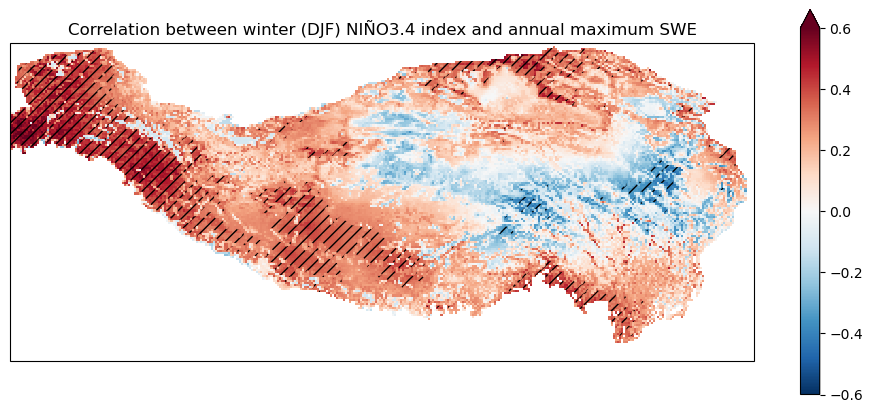

In [6]:
plot_corr_SWE_NINO34('TerraClimate')

# plot yearly maximum SWE anomalies

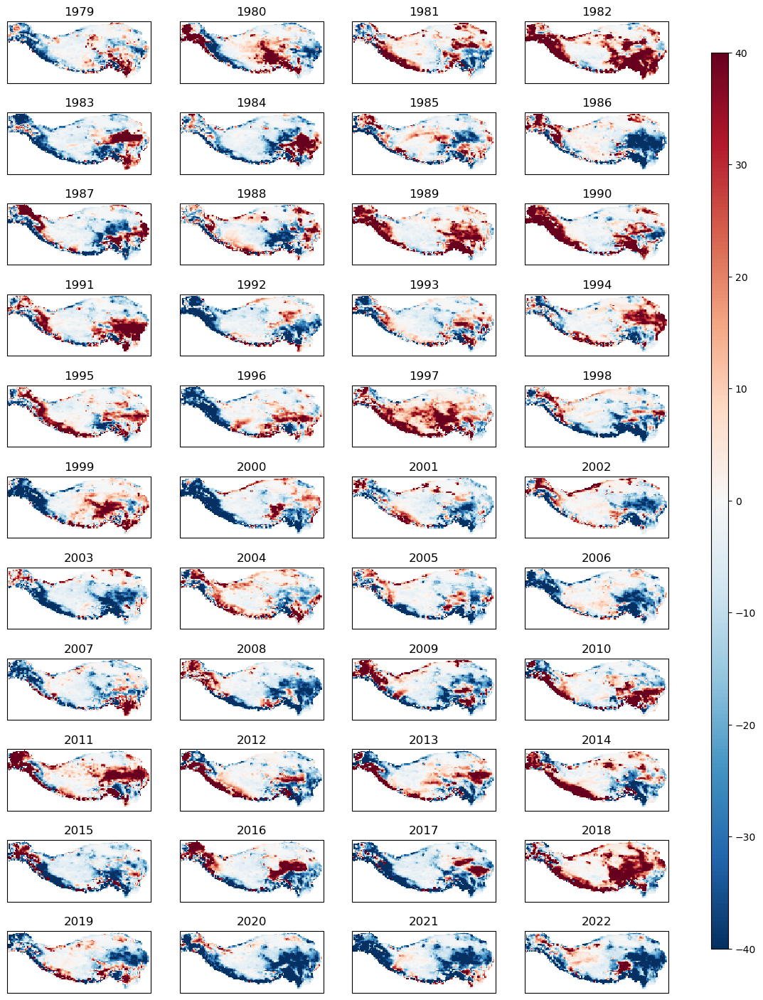

In [8]:
plot_dataset_yearly_max_ano('ERA5')

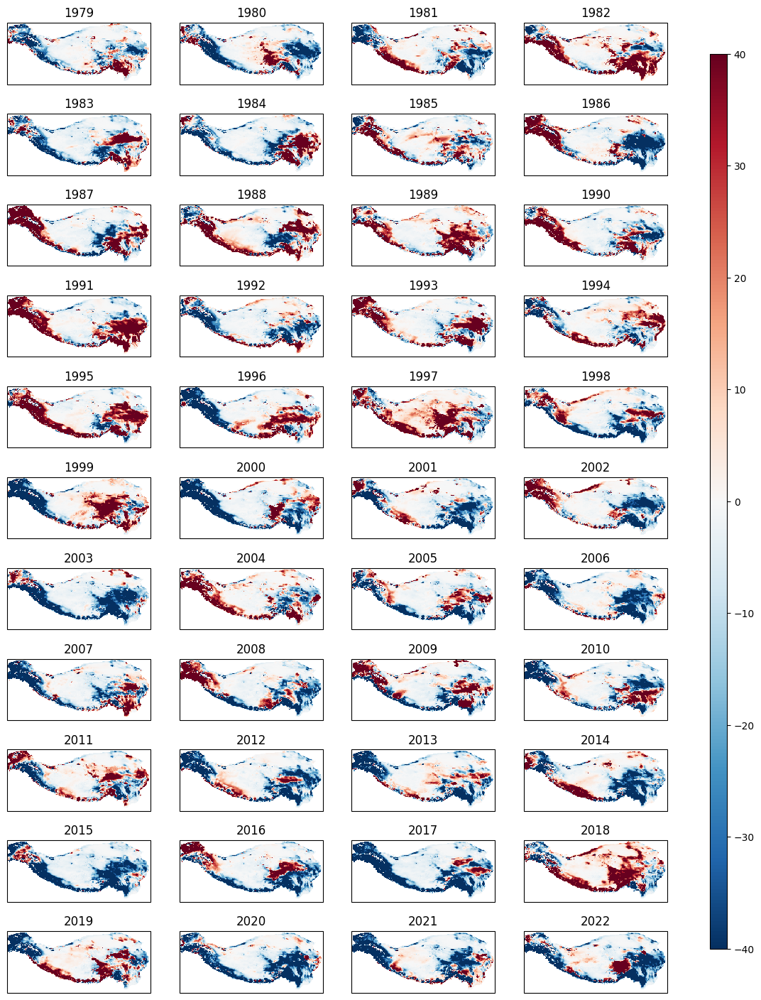

In [9]:
plot_dataset_yearly_max_ano('ERA5_Land')

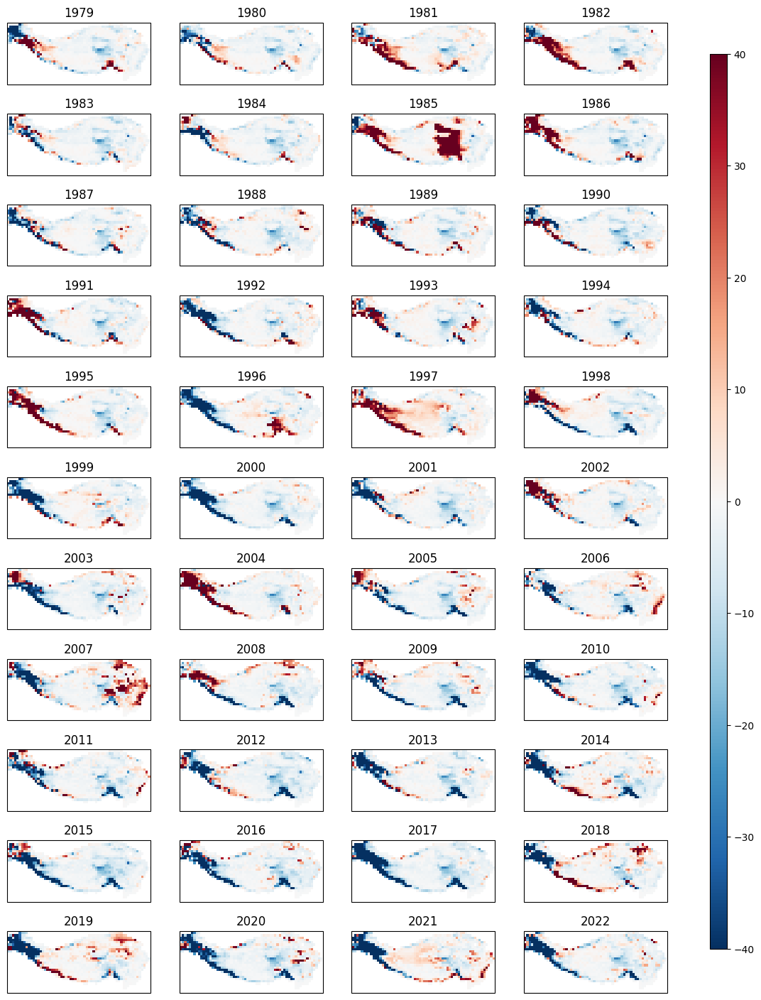

In [10]:
plot_dataset_yearly_max_ano('JRA55')

# plot yearly maximum SWE anomalies ranking

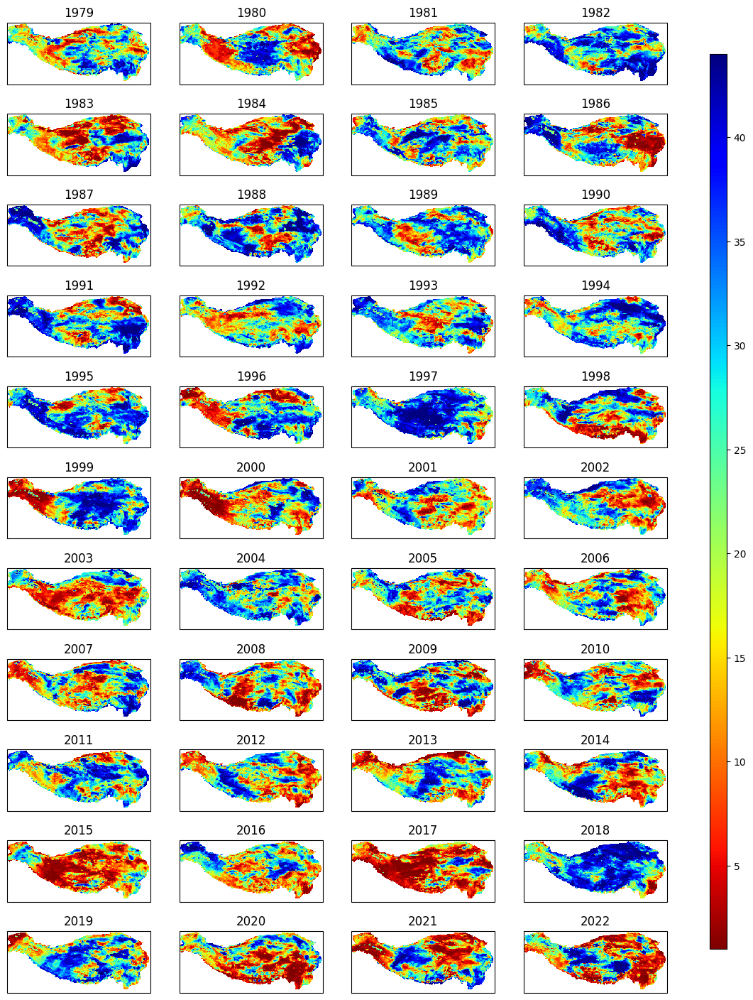

In [13]:
plot_dataset_yearly_max_ano_ranking('ERA5_Land')

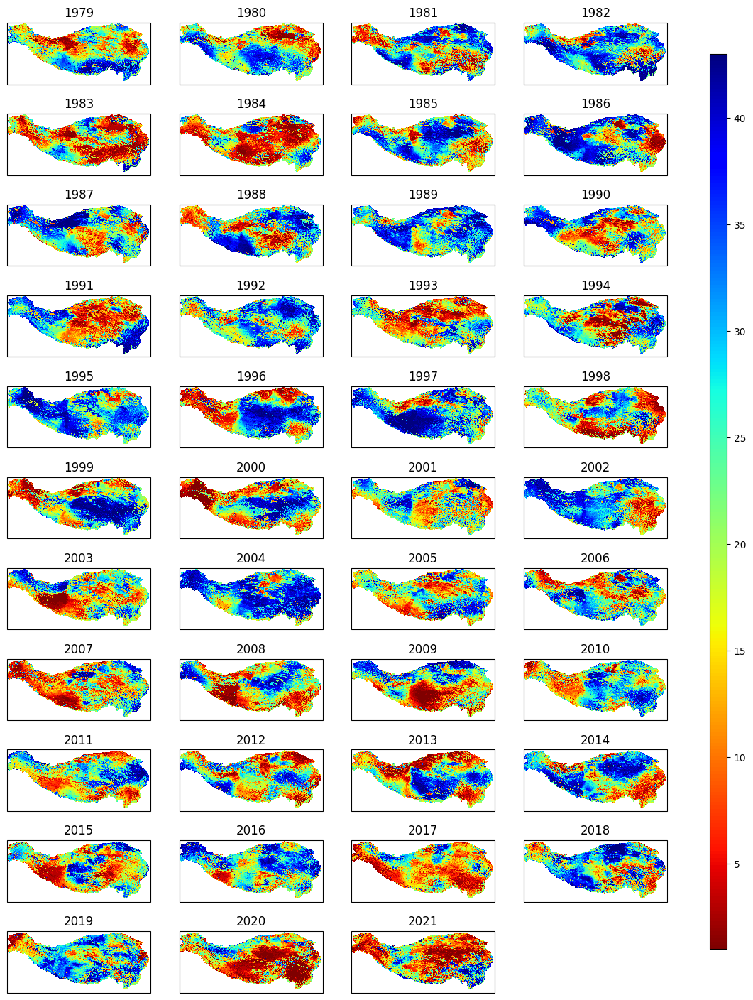

In [16]:
plot_dataset_yearly_max_ano_ranking('TerraClimate')

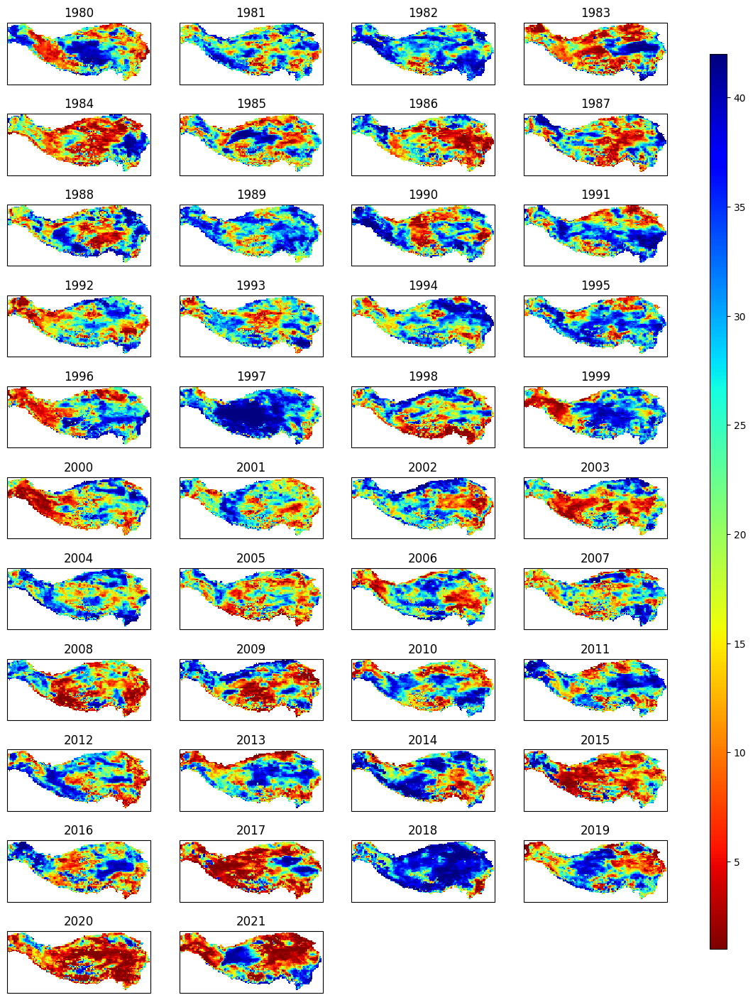

In [17]:
plot_dataset_yearly_max_ano_ranking('HARv2')

# plot trends of yearly maximum SWE anomalies

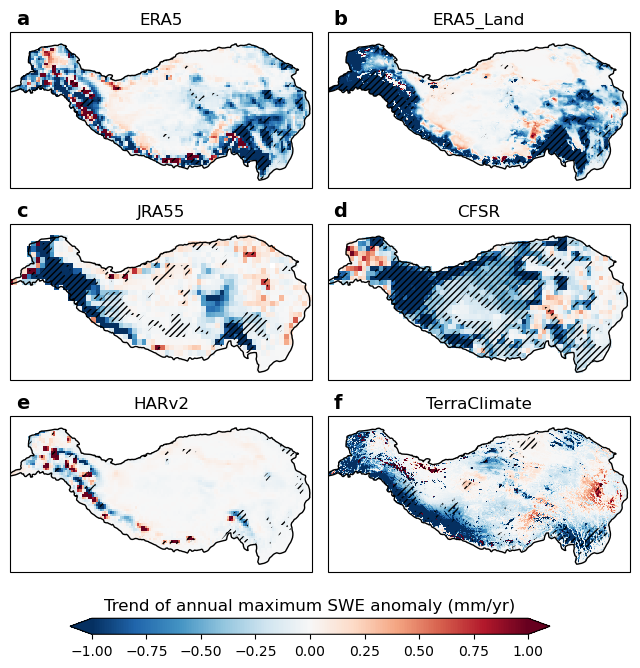

In [10]:
# plot trends of yearly maximum SWE anomalies for ['ERA5','ERA5_Land','JRA55','CFSR','HARv2','TerraClimate','FLDAS_NOAH_M','GLDAS_NOAH_M']
fig = plt.figure(figsize=(8, 8))
# for i, dn in enumerate(['JRA55','JRA55','JRA55','JRA55','JRA55','JRA55']):
for i, dn in enumerate(['ERA5','ERA5_Land','JRA55','CFSR','HARv2','TerraClimate']):
    ax = fig.add_subplot(3, 2, i+1, projection=ccrs.PlateCarree())
    ax.set_extent([68, 105, 25, 41], crs=ccrs.PlateCarree())
    plot_dataset_yearly_max_ano_trend(dn,ax=ax)
    # add TP shapefile
    TP_shp.plot(ax=ax, edgecolor='black', facecolor='none')
    ax.set_title(dn)
    # add colorbar in the bottom
    if i == 5:
        fig.subplots_adjust(bottom=0.2)
        cbar_ax = fig.add_axes([0.2, 0.125, 0.6, 0.02])
        fig.colorbar(ax.collections[0], cax=cbar_ax, orientation='horizontal', extend='both')
        # add title to the colorbar
        cbar_ax.set_title('Trend of annual maximum SWE anomaly (mm/yr)')
    # add panel label
    add_panel_label(ax, 'abcdef'[i],x=0.02,y=1.15)

fig.subplots_adjust(wspace=0.05, hspace=0.2)
plt.savefig('/Users/zeqinhuang/Documents/paper/TB_SWE/Figures/trend_of_annual_max_SWE_anomaly.png', dpi=300, bbox_inches='tight')
plt.savefig('/Users/zeqinhuang/Documents/paper/TB_SWE/Figures/trend_of_annual_max_SWE_anomaly.pdf', bbox_inches='tight')

# plot the correlation between SWE and NINO34

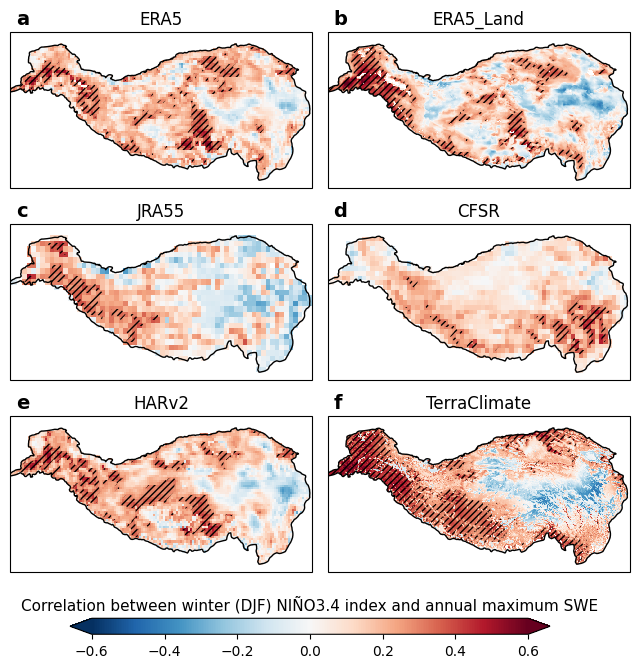

In [19]:
# plot the correlation between SWE and NINO34 for ['ERA5','ERA5_Land','JRA55','CFSR','HARv2','TerraClimate','FLDAS_NOAH_M','GLDAS_NOAH_M']
fig = plt.figure(figsize=(8, 8))
# for i, dn in enumerate(['JRA55','JRA55','JRA55','JRA55','JRA55','JRA55']):
for i, dn in enumerate(['ERA5','ERA5_Land','JRA55','CFSR','HARv2','TerraClimate']):
    ax = fig.add_subplot(3, 2, i+1, projection=ccrs.PlateCarree())
    ax.set_extent([68, 105, 25, 41], crs=ccrs.PlateCarree())
    plot_corr_SWE_NINO34(dn,ax=ax)
    # add TP shapefile
    TP_shp.plot(ax=ax, edgecolor='black', facecolor='none')
    ax.set_title(dn)
    # add panel label
    add_panel_label(ax, 'abcdef'[i],x=0.02,y=1.15)
    # add colorbar in the bottom
    if i == 5:
        fig.subplots_adjust(bottom=0.2)
        cbar_ax = fig.add_axes([0.2, 0.125, 0.6, 0.02])
        fig.colorbar(ax.collections[0], cax=cbar_ax, orientation='horizontal', extend='both')
        # add title to the colorbar
        cbar_ax.set_title('Correlation between winter (DJF) NIÑO3.4 index and annual maximum SWE',fontdict={'fontsize': 11})
    
fig.subplots_adjust(wspace=0.05, hspace=0.2)
plt.savefig('/Users/zeqinhuang/Documents/paper/TB_SWE/Figures/corr_SWE_NINO34.png', dpi=300, bbox_inches='tight')
plt.savefig('/Users/zeqinhuang/Documents/paper/TB_SWE/Figures/corr_SWE_NINO34.pdf', bbox_inches='tight')

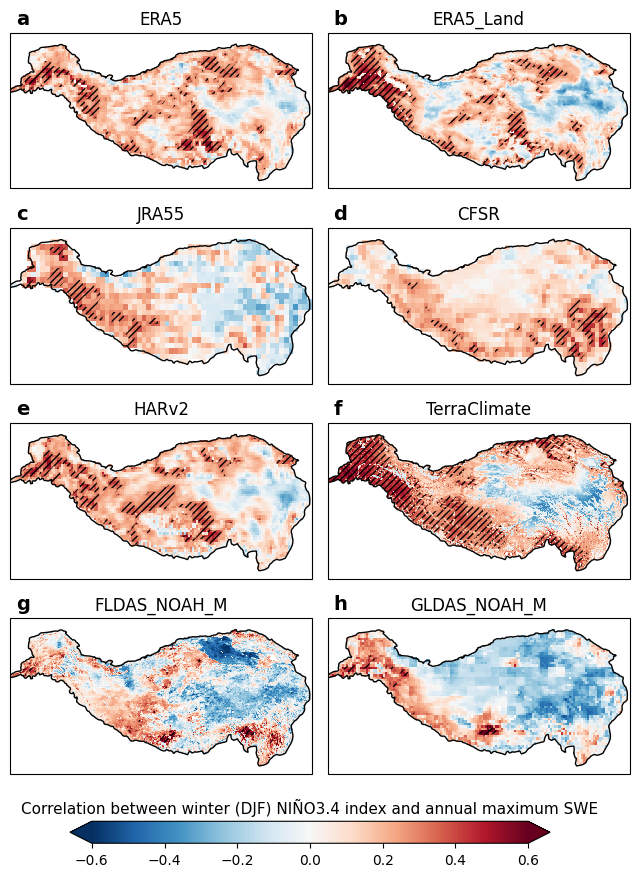

In [20]:
# plot the correlation between SWE and NINO34 for ['ERA5','ERA5_Land','JRA55','CFSR','HARv2','TerraClimate','FLDAS_NOAH_M','GLDAS_NOAH_M']
fig = plt.figure(figsize=(8, 11))
for i, dn in enumerate(['ERA5','ERA5_Land','JRA55','CFSR','HARv2','TerraClimate','FLDAS_NOAH_M','GLDAS_NOAH_M']):
    ax = fig.add_subplot(4, 2, i+1, projection=ccrs.PlateCarree())
    ax.set_extent([68, 105, 25, 41], crs=ccrs.PlateCarree())
    plot_corr_SWE_NINO34(dn,ax=ax)
    # add TP shapefile
    TP_shp.plot(ax=ax, edgecolor='black', facecolor='none')
    ax.set_title(dn)
    # add panel label
    add_panel_label(ax, 'abcdefgh'[i],x=0.02,y=1.15)
    # add colorbar in the bottom
    if i == 7:
        fig.subplots_adjust(bottom=0.2)
        cbar_ax = fig.add_axes([0.2, 0.14, 0.6, 0.02])
        fig.colorbar(ax.collections[0], cax=cbar_ax, orientation='horizontal', extend='both')
        # add title to the colorbar
        cbar_ax.set_title('Correlation between winter (DJF) NIÑO3.4 index and annual maximum SWE',fontdict={'fontsize': 11})
    
fig.subplots_adjust(wspace=0.05, hspace=0.2)
plt.savefig('/Users/zeqinhuang/Documents/paper/TB_SWE/Figures/corr_SWE_NINO34_2.png', dpi=300, bbox_inches='tight')
plt.savefig('/Users/zeqinhuang/Documents/paper/TB_SWE/Figures/corr_SWE_NINO34_2.pdf', bbox_inches='tight')

# plot composite maps of SWE for El Niño and La Niña years

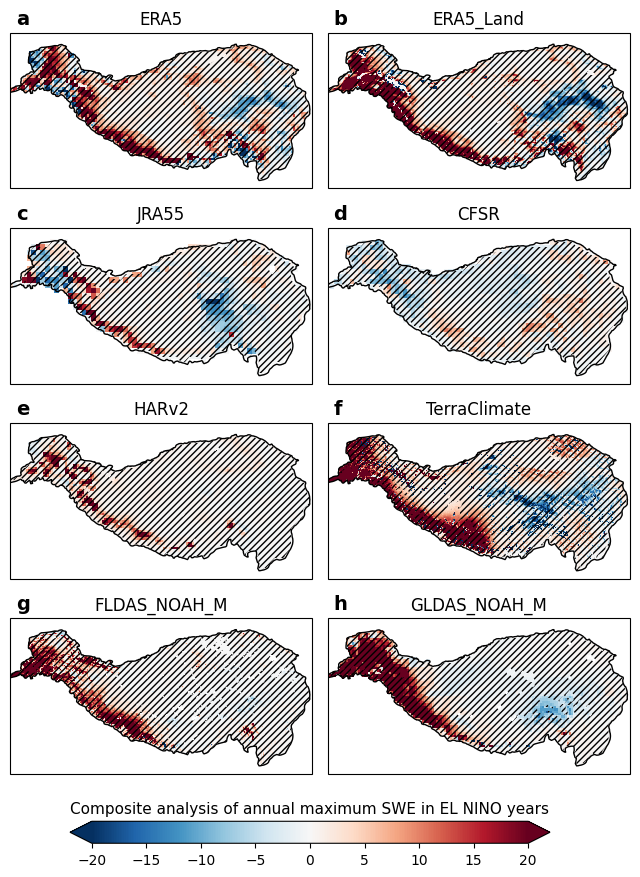

In [21]:
# plot composite maps of SWE for El Niño years
fig = plt.figure(figsize=(8, 11))
for i, dn in enumerate(['ERA5','ERA5_Land','JRA55','CFSR','HARv2','TerraClimate','FLDAS_NOAH_M','GLDAS_NOAH_M']):
    ax = fig.add_subplot(4, 2, i+1, projection=ccrs.PlateCarree())
    ax.set_extent([68, 105, 25, 41], crs=ccrs.PlateCarree())
    plot_SWE_ano_NINO(dn,ax=ax)
    # add TP shapefile
    TP_shp.plot(ax=ax, edgecolor='black', facecolor='none')
    ax.set_title(dn)
    # add panel label
    add_panel_label(ax, 'abcdefgh'[i],x=0.02,y=1.15)
    # add colorbar in the bottom
    if i == 7:
        fig.subplots_adjust(bottom=0.2)
        cbar_ax = fig.add_axes([0.2, 0.14, 0.6, 0.02])
        fig.colorbar(ax.collections[0], cax=cbar_ax, orientation='horizontal', extend='both')
        # add title to the colorbar
        cbar_ax.set_title('Composite analysis of annual maximum SWE in EL NINO years',fontdict={'fontsize': 11})

fig.subplots_adjust(wspace=0.05, hspace=0.2)
plt.savefig('/Users/zeqinhuang/Documents/paper/TB_SWE/Figures/SWE_ano_NINO.png', dpi=300, bbox_inches='tight')
plt.savefig('/Users/zeqinhuang/Documents/paper/TB_SWE/Figures/SWE_ano_NINO.pdf', bbox_inches='tight')

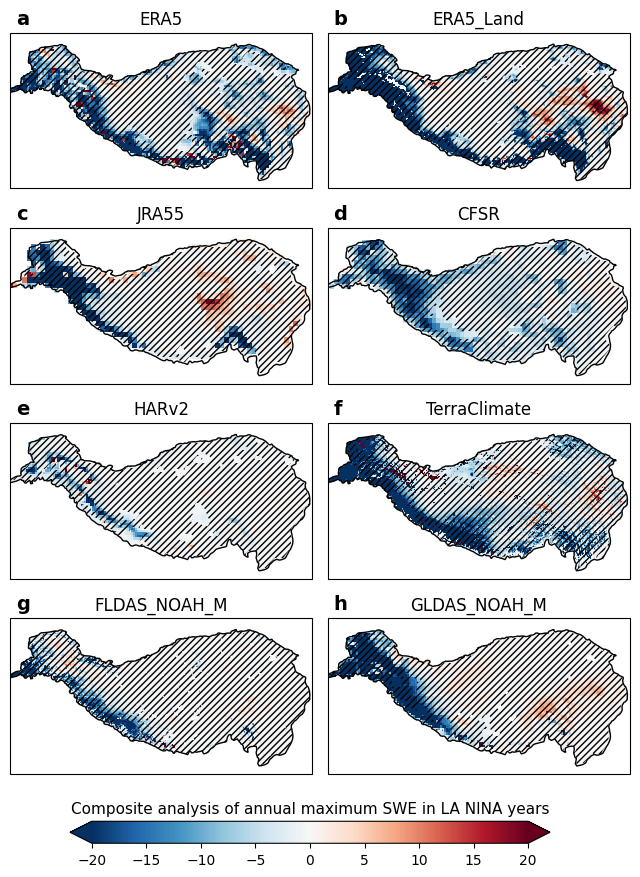

In [22]:
# plot composite maps of SWE for La Niña years
fig = plt.figure(figsize=(8, 11))
for i, dn in enumerate(['ERA5','ERA5_Land','JRA55','CFSR','HARv2','TerraClimate','FLDAS_NOAH_M','GLDAS_NOAH_M']):
# for i, dn in enumerate(['JRA55','JRA55','JRA55','JRA55','JRA55','JRA55','JRA55','JRA55']):
    ax = fig.add_subplot(4, 2, i+1, projection=ccrs.PlateCarree())
    ax.set_extent([68, 105, 25, 41], crs=ccrs.PlateCarree())
    plot_SWE_ano_NINA(dn,ax=ax)
    # add TP shapefile
    TP_shp.plot(ax=ax, edgecolor='black', facecolor='none')
    ax.set_title(dn)
    # add panel label
    add_panel_label(ax, 'abcdefgh'[i],x=0.02,y=1.15)
    # add colorbar in the bottom
    if i == 7:
        fig.subplots_adjust(bottom=0.2)
        cbar_ax = fig.add_axes([0.2, 0.14, 0.6, 0.02])
        fig.colorbar(ax.collections[0], cax=cbar_ax, orientation='horizontal', extend='both')
        # add title to the colorbar
        cbar_ax.set_title('Composite analysis of annual maximum SWE in LA NINA years',fontdict={'fontsize': 11})

fig.subplots_adjust(wspace=0.05, hspace=0.2)
plt.savefig('/Users/zeqinhuang/Documents/paper/TB_SWE/Figures/SWE_ano_NINA.png', dpi=300, bbox_inches='tight')
plt.savefig('/Users/zeqinhuang/Documents/paper/TB_SWE/Figures/SWE_ano_NINA.pdf', bbox_inches='tight')

# plot area weighted SWE anomalies

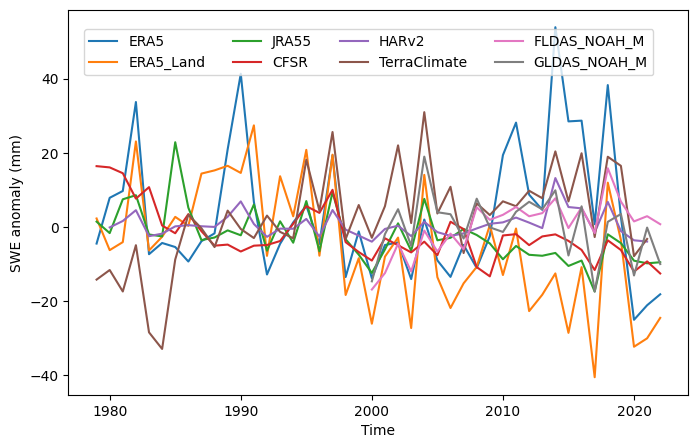

In [23]:
# plot area weighted SWE anomalies
fig = plt.figure(figsize=(8, 5))
for i, dn in enumerate(['ERA5','ERA5_Land','JRA55','CFSR','HARv2','TerraClimate','FLDAS_NOAH_M','GLDAS_NOAH_M']):
    SWE_ts = cal_area_weighted_SWE(dn)
    SWE_ts = SWE_ts.to_pandas()
    SWE_ts.plot(label=dn)
plt.xlabel('Time')
plt.ylabel('SWE anomaly (mm)')

ax.set_title('Area-weighted mean of annual maximum SWE')
plt.legend(bbox_to_anchor=(0.025, 0.95), loc='upper left', borderaxespad=0., ncol=4)
plt.savefig('/Users/zeqinhuang/Documents/paper/TB_SWE/Figures/area_weighted_SWE.png', dpi=300, bbox_inches='tight')
plt.savefig('/Users/zeqinhuang/Documents/paper/TB_SWE/Figures/area_weighted_SWE.pdf', bbox_inches='tight')


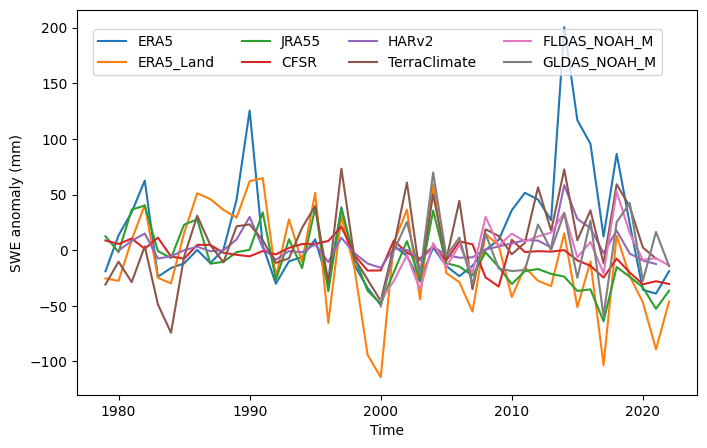

In [24]:
# only for western edge
# plot area weighted SWE anomalies
fig = plt.figure(figsize=(8, 5))
for i, dn in enumerate(['ERA5','ERA5_Land','JRA55','CFSR','HARv2','TerraClimate','FLDAS_NOAH_M','GLDAS_NOAH_M']):
    SWE_ts = cal_area_weighted_SWE_western_edge(dn)
    SWE_ts = SWE_ts.to_pandas()
    SWE_ts.plot(label=dn)
plt.xlabel('Time')
plt.ylabel('SWE anomaly (mm)')

ax.set_title('Area-weighted mean of annual maximum SWE')
plt.legend(bbox_to_anchor=(0.025, 0.95), loc='upper left', borderaxespad=0., ncol=4)
plt.savefig('/Users/zeqinhuang/Documents/paper/TB_SWE/Figures/area_weighted_SWE_western_edge.png', dpi=300, bbox_inches='tight')
plt.savefig('/Users/zeqinhuang/Documents/paper/TB_SWE/Figures/area_weighted_SWE_western_edge.pdf', bbox_inches='tight')


# Calculate SWEI for each dataset

In [6]:
from statsmodels.distributions.empirical_distribution import ECDF
from scipy.stats import norm, gamma

In [13]:
def droughtindx(nsample):
    indx = []
    for i in range(nsample):
        px = (i+1-0.44)/(nsample+0.12)
        indx.append(norm.ppf(px))
    return indx

# get reanalysis SWE dataarray of each monthly dataset
def get_reanalysis_data(dn):      # dn is the dataset name of the monthly dataset
    data = xr.open_dataset(dataset_monthly_paths[dn])
    if dn == 'CFSR':
        data = data.rename({'WEASD_L1_Avg':'SWE'})
    elif dn == 'HARv2':
        data = data.rename({'snow':'SWE'})
    elif dn == 'TerraClimate':
        data = data.rename({'swe':'SWE'})
        data = data.interp(lat=np.arange(22, 46, 0.1), lon=np.arange(66, 108, 0.1))
    elif dn in ['FLDAS_NOAH_M','GLDAS_CLSM_M','GLDAS_NOAH_M','GLDAS_VIC_M']:
        try:
            data = data.rename({'SWE_inst':'SWE','X':'lon','Y':'lat'})
        except:
            data = data.rename({'SWE_inst':'SWE'})
        
    if dn in ['ERA5','ERA5_Land']:
        data = data * 1000
    
    # clip the data with Tibetan Plateau shapefile using rioxarray
    data_da = data['SWE']
    data_da.rio.set_crs("epsg:4326")
    data_da.rio.set_spatial_dims("lon", "lat", inplace=True)
    data_da = data_da.rio.clip(TP_shp.geometry.apply(mapping), TP_shp.crs)

    data = data_da.to_dataset()
    return data

# get the month with maximum SWE for each year
def get_swe_maximum_month(dn,ds=None):
    if ds is None:
        ds = get_reanalysis_data(dn)
    else:
        ds = ds.rename({'snw':'SWE'})

    # Compute the 3-month cumulative sum for each pixel
    ds_cumsum = ds.rolling(time=3, min_periods=3).sum()
    # select time span from 1979-09 to 2023-08 (Water year)
    # ds_cumsum = ds_cumsum.sel(time=slice('1979-09', '2023-08'))
    ds_cumsum = ds_cumsum.sel(time=slice(str(dataset_time_spans[dn][0])+'-09', str(dataset_time_spans[dn][1]) + '-08'))

    years = np.unique(ds_cumsum.time.dt.year)

    # Reshape the data back into a 4D array of (year, month, lat, lon)
    ds_new = xr.DataArray(
        ds_cumsum.SWE.data.reshape((-1, 12, ds.sizes['lat'], ds.sizes['lon'])),
        dims=('year', 'month', 'lat', 'lon'),
        coords={'year': years[:-1], 'month': [9,10,11,12,1,2,3,4,5,6,7,8], 'lat': ds['lat'], 'lon': ds['lon']}
    )

    # select the month with maximum SWE for each year (return a 4D boolean array)
    ds_year_maximum = ds_new == ds_new.max(dim='month')
    return ds_year_maximum

# SWEI calculation for observation (Reanalysis) and historical senario (CMIP6)
# dn is the dataset name of the monthly dataset, including ['ERA5','ERA5_Land','JRA55','CFSR','HARv2','TerraClimate','FLDAS_NOAH_M','GLDAS_NOAH_M','CMIP6-hist','CMIP6-NAT']
def get_swei_hist(dn,ds=None):
    if ds is None:
        ds = get_reanalysis_data(dn)
        swe = ds['SWE']
    else:
        ds = ds.rename({'snw':'SWE'})
        swe = ds['SWE']
    nlat = swe.shape[2]
    nlon = swe.shape[1]
    nm = 12

    # Compute the 3-month cumulative sum for each pixel
    ds_cumsum = ds.rolling(time=3, min_periods=3).sum()
    # select time span from 1979-09 to 2023-08 (Water year)
    # ds_cumsum = ds_cumsum.sel(time=slice('1979-09', '2023-08'))
    ds_cumsum = ds_cumsum.sel(time=slice(str(dataset_time_spans[dn][0])+'-09', str(dataset_time_spans[dn][1]) + '-08'))

    years = np.unique(ds_cumsum.time.dt.year)
    months = np.unique(ds_cumsum.time.dt.month)

    # Reshape the data back into a 4D array of (year, month, lat, lon)
    ds_new = xr.DataArray(
        ds_cumsum.SWE.data.reshape((-1, 12, ds.sizes['lat'], ds.sizes['lon'])),
        dims=('year', 'month', 'lat', 'lon'),
        coords={'year': years[:-1], 'month': [9,10,11,12,1,2,3,4,5,6,7,8], 'lat': ds['lat'], 'lon': ds['lon']}
    )
    
    nyr = len(years) - 1
    categ = np.zeros((nyr, nm, nlon, nlat))
    nsample = nyr
    sweix = droughtindx(nsample)  # all values for each pixel.
    sweix = np.array(sweix)

    aindx = np.argsort(ds_new.data, axis=0)

    # Create a broadcasting version of sweix
    sweix_broadcasted = sweix[:, np.newaxis, np.newaxis, np.newaxis]

    # Assign sorted sweix values to categ based on sorted indices (array, indices, values, axis)
    np.put_along_axis(categ, aindx,sweix_broadcasted, axis=0)

    # clip category with Tibetan Plateau shapefile using rioxarray
    categ_da = xr.DataArray(categ, dims=('year', 'month', 'lat', 'lon'), coords={'year': years[:-1], 'month': [9,10,11,12,1,2,3,4,5,6,7,8], 'lat': ds['lat'], 'lon': ds['lon']})
    categ_da.rio.set_crs("epsg:4326")
    categ_da.rio.set_spatial_dims("lon", "lat", inplace=True)
    categ_da = categ_da.rio.clip(TP_shp.geometry.apply(mapping), TP_shp.crs)

    # Create the new xarray Dataset
    ds_swei = xr.Dataset(
        {'swei':(('year','month','lat','lon'), categ_da.data)},
        coords={'year': years[:-1], 'month': [9,10,11,12,1,2,3,4,5,6,7,8], 'lat': categ_da['lat'], 'lon': categ_da['lon']}
    )
    return ds_swei

# plot trends of SWEI for each dataset
def cal_dataset_SWEI_spatial_trend(dn,ds=None):
    ds_swei = get_swei_hist(dn,ds=ds)
    ds_swei_year = ds_swei.sel(month=3)
    # calculate the trend of ds_swei_year
    ds_swei_year_trend = trend_cal(ds_swei_year)
    # mask ds_swei_year_trend with Tibetan Plateau shapefile using rioxarray
    ds_swei_year_trend.rio.set_crs("epsg:4326")
    ds_swei_year_trend.rio.set_spatial_dims("lon", "lat", inplace=True)
    ds_swei_year_trend_masked = ds_swei_year_trend.rio.clip(TP_shp.geometry.apply(mapping), TP_shp.crs)

    # calculate the p-value of ds_swei_year_trend
    ds_swei_year_trend_pval = trend_cal_pval(ds_swei_year)
    # mask ds_swei_year_trend_pval with Tibetan Plateau shapefile using rioxarray
    ds_swei_year_trend_pval.rio.set_crs("epsg:4326")
    ds_swei_year_trend_pval.rio.set_spatial_dims("lon", "lat", inplace=True)
    ds_swei_year_trend_pval_masked = ds_swei_year_trend_pval.rio.clip(TP_shp.geometry.apply(mapping), TP_shp.crs)

    return ds_swei_year_trend_masked, ds_swei_year_trend_pval_masked

# plot trends of SWEI for each dataset
def plot_dataset_SWEI_trend(dn,ax=None):
    ds_swei_year_trend_masked, ds_swei_year_trend_pval_masked = cal_dataset_SWEI_spatial_trend(dn)
    ds_swei_year_trend_masked = ds_swei_year_trend_masked['swei']
    ds_swei_year_trend_pval_masked = ds_swei_year_trend_pval_masked['swei']
    # plot ds_swei_year_trend_masked with matplotlib
    if ax == None:
        fig = plt.figure(figsize=(12, 5))
        ax = fig.add_subplot(1, 1, 1, projection=ccrs.PlateCarree())
        ax.set_extent([70, 105, 25, 40], crs=ccrs.PlateCarree())
        p = ds_swei_year_trend_masked.plot(ax=ax, add_colorbar=True, cmap=cmaps.temp_diff_18lev_r, levels=np.arange(-0.1, 0.11, 0.01)*0.5)
        ds_swei_year_trend_pval_masked.where(ds_swei_year_trend_pval_masked> 0.05).plot.contourf(ax=ax, levels=[0, 0.05], hatches=['///'], alpha=0, add_colorbar=False)
        ax.set_title('Trend of SWEI in '+dn)
    else:
        p = ds_swei_year_trend_masked.plot(ax=ax, add_colorbar=False, cmap=cmaps.temp_diff_18lev_r, levels=np.arange(-0.1, 0.11, 0.01)*0.5)
        ds_swei_year_trend_pval_masked.where(ds_swei_year_trend_pval_masked> 0.05).plot.contourf(ax=ax, levels=[0, 0.05], hatches=['///'], alpha=0, add_colorbar=False)
        ax.set_title('Trend of SWEI in '+dn)


# calculate area weighted SWEI
def cal_area_weighted_SWEI(dn,ds=None):
    ds_swei = get_swei_hist(dn,ds=ds)
    
    ds_swei_year = ds_swei.sel(month=3)
    # # select monthly SWEI where SWE anomalies are maximum
    # ds_yearly_max = get_swe_maximum_month(dn,ds=ds)
    # ds_swei_year = ds_swei.where(ds_yearly_max)

    # reshape from 4D to 3D
    ds_swei_month = ds_swei.stack(z=('year','month'))

    # calculate area-weighted mean of ds_swei
    # first calculate the weight of each grid cell
    weights = np.cos(np.deg2rad(ds_swei.lat))
    weights.name = 'weights'
    ds_swei_year_weighted = ds_swei_year.weighted(weights)
    ds_swei_month_weighted = ds_swei_month.weighted(weights)
    ds_swei_year_ts = ds_swei_year_weighted.mean(('lon','lat'))
    ds_swei_month_ts = ds_swei_month_weighted.mean(('lon','lat'))
    return ds_swei_year_ts, ds_swei_month_ts


# calculate the correlation between SWEI and NINO3
def corr_SWEI_NINO3(dn, ds=None):
    ds_swei = get_swei_hist(dn,ds=ds)
    ds_swei_year = ds_swei.sel(month=3)

    # transform NINO3 to xarray dataarray
    NINO3_da = xr.DataArray(NINO3, dims=['time'])
    NINO3_da = NINO3_da.sel(time=slice(str(dataset_time_spans[dn][0]), str(dataset_time_spans[dn][1]-1)))
    NINO3_da_QS = NINO3_da.resample(time='QS-DEC').mean()
    NINO3_da_DJF = NINO3_da_QS.sel(time=NINO3_da_QS['time.month']==12)
    NINO3_da_DJF = NINO3_da_DJF[1:]

    # calculate the correlation between SWEI_march and NINO3_DJF
    SWEI_march_NINO3_corr = xr.apply_ufunc(corr_cal, ds_swei_year['swei'], NINO3_da_DJF, input_core_dims=[['year'], ['time']], vectorize=True)
    # mask SWEI_march_NINO3_corr with Tibetan Plateau shapefile using rioxarray
    SWEI_march_NINO3_corr.rio.set_crs("epsg:4326")
    SWEI_march_NINO3_corr.rio.set_spatial_dims("lon", "lat", inplace=True)
    SWEI_march_NINO3_corr_masked = SWEI_march_NINO3_corr.rio.clip(TP_shp.geometry.apply(mapping), TP_shp.crs)
    return SWEI_march_NINO3_corr_masked

# calculate pvalue of the correlation between SWEI and NINO3
def pvalue_corr_SWEI_NINO3(dn, ds=None):
    ds_swei = get_swei_hist(dn,ds=ds)
    ds_swei_year = ds_swei.sel(month=3)

    # transform NINO3 to xarray dataarray
    NINO3_da = xr.DataArray(NINO3, dims=['time'])
    NINO3_da = NINO3_da.sel(time=slice(str(dataset_time_spans[dn][0]), str(dataset_time_spans[dn][1]-1)))
    NINO3_da_QS = NINO3_da.resample(time='QS-DEC').mean()
    NINO3_da_DJF = NINO3_da_QS.sel(time=NINO3_da_QS['time.month']==12)
    NINO3_da_DJF = NINO3_da_DJF[1:]

    # calculate the pvalue of the correlation between SWEI_march and NINO3_DJF
    SWEI_march_NINO3_corr_p = xr.apply_ufunc(corr_p_cal, ds_swei_year['swei'], NINO3_da_DJF, input_core_dims=[['year'], ['time']], vectorize=True)
    # mask SWEI_march_NINO3_corr_p with Tibetan Plateau shapefile using rioxarray
    SWEI_march_NINO3_corr_p.rio.set_crs("epsg:4326")
    SWEI_march_NINO3_corr_p.rio.set_spatial_dims("lon", "lat", inplace=True)
    SWEI_march_NINO3_corr_p_masked = SWEI_march_NINO3_corr_p.rio.clip(TP_shp.geometry.apply(mapping), TP_shp.crs)
    return SWEI_march_NINO3_corr_p_masked

# plot the correlation between SWEI and NINO3
def plot_corr_SWEI_NINO3(dn,ax=None):
    SWEI_march_NINO3_corr_masked = corr_SWEI_NINO3(dn)
    SWEI_march_NINO3_corr_p_masked = pvalue_corr_SWEI_NINO3(dn)
    # plot SWEI_march_NINO3_corr_masked with matplotlib
    if ax == None:
        fig = plt.figure(figsize=(12, 5))
        ax = fig.add_subplot(1, 1, 1, projection=ccrs.PlateCarree())
        ax.set_extent([70, 105, 25, 40], crs=ccrs.PlateCarree())
        SWEI_march_NINO3_corr_masked.plot(ax=ax, vmax=0.6, vmin=-0.6, cmap='RdBu_r', add_colorbar=True)
        # add hatches to the grid cells with p-value < 0.05
        SWEI_march_NINO3_corr_p_masked.where(SWEI_march_NINO3_corr_p_masked<0.05).plot.contourf(ax=ax, levels=[0, 0.05], hatches=['///'], alpha=0, add_colorbar=False)
        ax.set_title('Correlation between winter (DJF) NIÑO3.4 index and annual maximum SWEI')
    else:
        SWEI_march_NINO3_corr_masked.plot(ax=ax, vmax=0.6, vmin=-0.6, cmap='RdBu_r', add_colorbar=False)
        # add hatches to the grid cells with p-value < 0.05
        SWEI_march_NINO3_corr_p_masked.where(SWEI_march_NINO3_corr_p_masked<0.05).plot.contourf(ax=ax, levels=[0, 0.05], hatches=['/////'], alpha=0, add_colorbar=False)
        ax.set_title('Correlation between winter (DJF) NIÑO3.4 index and annual maximum SWEI')

# define a function to calculate the composite anomaly of SWEI during El Nino years (using NINO3 index instead of NINO3.4 index)
def cal_SWEI_ano_NINO(dn):
    ds_swei = get_swei_hist(dn)
    ds_swei = ds_swei.sel(month=3)
    # transform NINO3 to xarray dataarray
    NINO3_da = xr.DataArray(NINO3, dims=['time'])
    NINO3_da = NINO3_da.sel(time=slice(str(dataset_time_spans[dn][0]), str(dataset_time_spans[dn][1]-1)))
    NINO3_da_QS = NINO3_da.resample(time='QS-DEC').mean()
    NINO3_da_DJF = NINO3_da_QS.sel(time=NINO3_da_QS['time.month']==12)
    NINO3_da_DJF = NINO3_da_DJF[1:]

    # select EL NINO years
    NINO_year = NINO3_da_DJF.where(NINO3_da_DJF>0.5).dropna(dim='time').time.dt.year

    # select ds_swei of EL NINO years
    ds_swei_NINO = ds_swei.sel(year=NINO_year)
    # calculate the mean of ds_swei_NINO
    ds_swei_NINO_mean = ds_swei_NINO.mean(dim='time')

    # pairwise t-test to test whether the difference between ds_swei_NINO and ds_swei is significant
    ttest_res_NINO = ttest_ind(ds_swei_NINO['swei'], ds_swei['swei'], axis=0, equal_var=False)
    # create dataarray of ttest_res.pvalue
    # A p-value larger than a chosen threshold (e.g. 5% or 1%) indicates that our observation is not so unlikely to have occurred by chance.
    ttest_res_NINO_pvalue = xr.DataArray(ttest_res_NINO.pvalue, dims=['lat', 'lon'], coords={'lat':ds_swei.lat, 'lon':ds_swei.lon})

    return ds_swei_NINO_mean, ttest_res_NINO_pvalue

# define a function to calculate the composite anomaly of SWEI during La Nina years (using NINO3 index instead of NINO3.4 index)
def cal_SWEI_ano_NINA(dn):
    ds_swei = get_swei_hist(dn)
    ds_swei = ds_swei.sel(month=3)
    # transform NINO3 to xarray dataarray
    NINO3_da = xr.DataArray(NINO3, dims=['time'])
    NINO3_da = NINO3_da.sel(time=slice(str(dataset_time_spans[dn][0]), str(dataset_time_spans[dn][1]-1)))
    NINO3_da_QS = NINO3_da.resample(time='QS-DEC').mean()
    NINO3_da_DJF = NINO3_da_QS.sel(time=NINO3_da_QS['time.month']==12)
    NINO3_da_DJF = NINO3_da_DJF[1:]

    # select LA NINA years
    NINA_year = NINO3_da_DJF.where(NINO3_da_DJF<-0.5).dropna(dim='time').time.dt.year

    # select ds_swei of LA NINA years
    ds_swei_NINA = ds_swei.sel(year=NINA_year)
    # calculate the mean of ds_swei_NINA
    ds_swei_NINA_mean = ds_swei_NINA.mean(dim='time')

    # pairwise t-test to test whether the difference between ds_swei_NINA and ds_swei is significant
    ttest_res_NINA = ttest_ind(ds_swei_NINA['swei'], ds_swei['swei'], axis=0, equal_var=False)
    # create dataarray of ttest_res.pvalue
    # A p-value larger than a chosen threshold (e.g. 5% or 1%) indicates that our observation is not so unlikely to have occurred by chance.
    ttest_res_NINA_pvalue = xr.DataArray(ttest_res_NINA.pvalue, dims=['lat', 'lon'], coords={'lat':ds_swei.lat, 'lon':ds_swei.lon})

    return ds_swei_NINA_mean, ttest_res_NINA_pvalue

def plot_SWEI_ano_NINA(dn,ax=None):
    ds_swei_NINA_mean, ttest_res_NINA_pvalue = cal_SWEI_ano_NINA(dn)
    # plot ds_swei_NINA_mean with matplotlib
    if ax == None:
        fig = plt.figure(figsize=(12, 5))
        ax = fig.add_subplot(1, 1, 1, projection=ccrs.PlateCarree())
        ax.set_extent([70, 105, 25, 40], crs=ccrs.PlateCarree())
        ds_swei_NINA_mean.plot(ax=ax, vmax=0.6, vmin=-0.6, cmap=cmaps.temp_diff_18lev_r, add_colorbar=True)
        # add hatches to the grid cells with p-value > 0.05
        ttest_res_NINA_pvalue.where(ttest_res_NINA_pvalue>0.05).plot.contourf(ax=ax, levels=[0, 0.05], hatches=['///'], alpha=0, add_colorbar=False)
        ax.set_title('Composite anomalies of March SWEI during La niña years')
    else:
        ds_swei_NINA_mean['swei'].plot(ax=ax, vmax=0.6, vmin=-0.6, cmap=cmaps.temp_diff_18lev_r, add_colorbar=False)
        # add hatches to the grid cells with p-value > 0.05
        ttest_res_NINA_pvalue.where(ttest_res_NINA_pvalue>0.05).plot.contourf(ax=ax, levels=[0, 0.05], hatches=['///'], alpha=0, add_colorbar=False)
        ax.set_title('Composite anomalies of March SWEI during La niña years')

import cmaps
def plot_SWEI_ano_NINO(dn,ax=None):
    ds_swei_NINO_mean, ttest_res_NINO_pvalue = cal_SWEI_ano_NINO(dn)
    # plot ds_swei_NINO_mean with matplotlib
    if ax == None:
        fig = plt.figure(figsize=(12, 5))
        ax = fig.add_subplot(1, 1, 1, projection=ccrs.PlateCarree())
        ax.set_extent([70, 105, 25, 40], crs=ccrs.PlateCarree())
        ds_swei_NINO_mean.plot(ax=ax, vmax=0.6, vmin=-0.6, cmap=cmaps.temp_diff_18lev_r, add_colorbar=True)
        # add hatches to the grid cells with p-value > 0.05
        ttest_res_NINO_pvalue.where(ttest_res_NINO_pvalue>0.05).plot.contourf(ax=ax, levels=[0, 0.05], hatches=['///'], alpha=0, add_colorbar=False)
        ax.set_title('Composite anomalies of March SWEI during El niño years')
    else:
        ds_swei_NINO_mean['swei'].plot(ax=ax, vmax=0.6, vmin=-0.6, cmap=cmaps.temp_diff_18lev_r, add_colorbar=False)
        # add hatches to the grid cells with p-value > 0.05
        ttest_res_NINO_pvalue.where(ttest_res_NINO_pvalue>0.05).plot.contourf(ax=ax, levels=[0, 0.05], hatches=['///'], alpha=0, add_colorbar=False)
        ax.set_title('Composite anomalies of March SWEI during El niño years')


In [8]:
# calculate the spatial distribution of SWEI trend for each dataset and save the result to a netcdf file
for dn in ['ERA5','ERA5_Land','JRA55','CFSR','HARv2','TerraClimate']:
    ds_swei_year_trend_masked, ds_swei_year_trend_pval_masked = cal_dataset_SWEI_spatial_trend(dn)
    ds_swei_year_trend_masked.to_netcdf('/Users/zeqinhuang/Documents/paper/TB_SWE/processed_data/SWEI_trend_'+dn+'.nc')
    ds_swei_year_trend_pval_masked.to_netcdf('/Users/zeqinhuang/Documents/paper/TB_SWE/processed_data/SWEI_trend_pval_'+dn+'.nc')

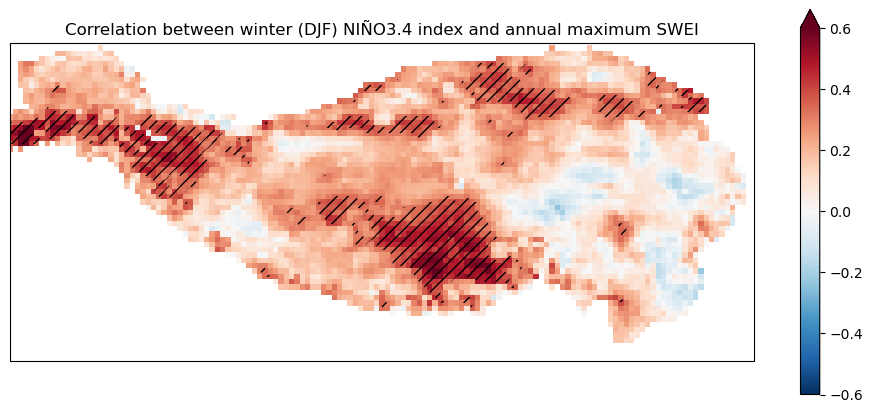

In [9]:
plot_corr_SWEI_NINO3('ERA5')

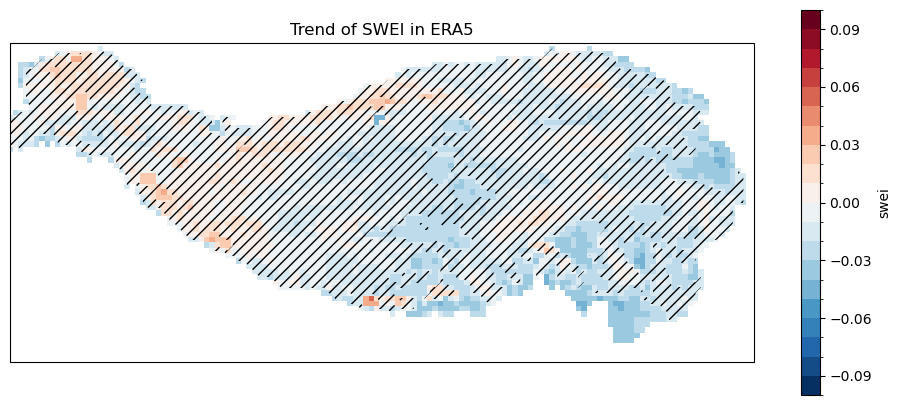

In [20]:
plot_dataset_SWEI_trend('ERA5')

In [ ]:
# plot the correlation between SWEI and NINO3 for ['ERA5','ERA5_Land','JRA55','CFSR','HARv2','TerraClimate']
fig = plt.figure(figsize=(8, 8))

for i, dn in enumerate(['ERA5','ERA5_Land','JRA55','CFSR','HARv2','TerraClimate']):
    ax = fig.add_subplot(3, 2, i+1, projection=ccrs.PlateCarree())
    ax.set_extent([68, 105, 25, 41], crs=ccrs.PlateCarree())
    plot_corr_SWEI_NINO3(dn,ax=ax)
    # add TP shapefile
    TP_shp.plot(ax=ax, edgecolor='black', facecolor='none')
    ax.set_title(dn)
    # add panel label
    add_panel_label(ax, 'abcdef'[i],x=0.02,y=1.15)
    # add colorbar in the bottom
    if i == 5:
        fig.subplots_adjust(bottom=0.2)
        cbar_ax = fig.add_axes([0.2, 0.125, 0.6, 0.02])
        fig.colorbar(ax.collections[0], cax=cbar_ax, orientation='horizontal', extend='both')
        # add title to the colorbar
        cbar_ax.set_title('Correlation between winter (DJF) NIÑO3 index and March SWEI',fontdict={'fontsize': 11})

# save the figure
fig.subplots_adjust(wspace=0.05, hspace=0.2)
plt.savefig('/Users/zeqinhuang/Documents/paper/TB_SWE/Figures/corr_SWEI_NINO3_reanalysis.png', dpi=300, bbox_inches='tight')
plt.savefig('/Users/zeqinhuang/Documents/paper/TB_SWE/Figures/corr_SWEI_NINO3_reanalysis.pdf', bbox_inches='tight')

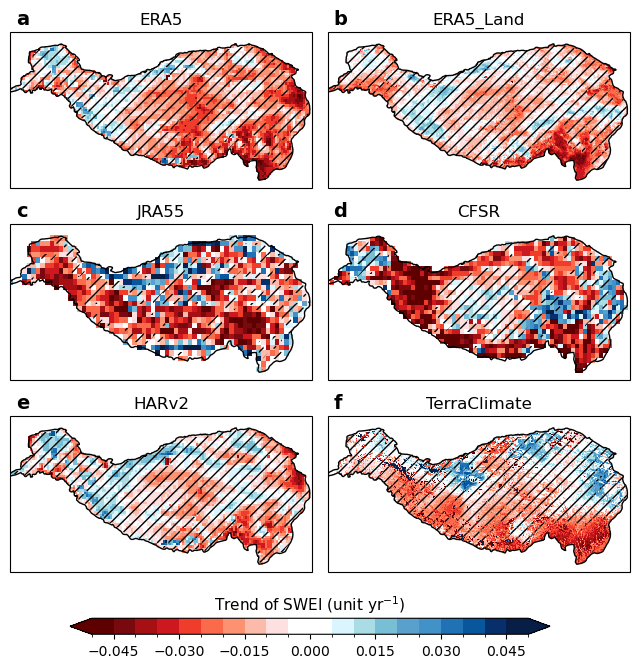

In [14]:
# plot the spatial distribution of SWEI trend for ['ERA5','ERA5_Land','JRA55','CFSR','HARv2','TerraClimate']
fig = plt.figure(figsize=(8, 8))

for i, dn in enumerate(['ERA5','ERA5_Land','JRA55','CFSR','HARv2','TerraClimate']):
    ax = fig.add_subplot(3, 2, i+1, projection=ccrs.PlateCarree())
    ax.set_extent([68, 105, 25, 41], crs=ccrs.PlateCarree())
    plot_dataset_SWEI_trend(dn,ax=ax)
    # add TP shapefile
    TP_shp.plot(ax=ax, edgecolor='black', facecolor='none')
    ax.set_title(dn)
    # add panel label
    add_panel_label(ax, 'abcdef'[i],x=0.02,y=1.15)
    # add colorbar in the bottom
    if i == 5:
        fig.subplots_adjust(bottom=0.2)
        cbar_ax = fig.add_axes([0.2, 0.125, 0.6, 0.02])
        fig.colorbar(ax.collections[0], cax=cbar_ax, orientation='horizontal', extend='both')
        # add title to the colorbar
        cbar_ax.set_title('Trend of SWEI (unit yr$^{-1}$)',fontdict={'fontsize': 11})

# save the figure
fig.subplots_adjust(wspace=0.05, hspace=0.2)
plt.savefig('/Users/zeqinhuang/Documents/paper/TB_SWE/Figures/SWEI_trend_reanalysis.png', dpi=300, bbox_inches='tight')
plt.savefig('/Users/zeqinhuang/Documents/paper/TB_SWE/Figures/SWEI_trend_reanalysis.pdf', bbox_inches='tight')

# plot the correlation between SWEI and NINO3

In [87]:
# calculate the March SWEI for each dataset
for dn in ['ERA5','ERA5_Land','JRA55','CFSR','HARv2','TerraClimate']:
    ds_swei = get_swei_hist(dn)
    ds_swei_year = ds_swei.sel(month=3)
    ds_swei_year.to_netcdf('/Users/zeqinhuang/Documents/paper/TB_SWE/processed_data/SWEI_yearly_'+dn+'.nc')

In [89]:
# calculate the correlation between SWEI and NINO3
for dn in ['ERA5','ERA5_Land','JRA55','CFSR','HARv2','TerraClimate']:
    SWEI_march_NINO3_corr_masked = corr_SWEI_NINO3(dn)
    SWEI_march_NINO3_corr_masked.name = 'SWEI_NINO3_corr'
    SWEI_march_NINO3_corr_masked.to_netcdf('/Users/zeqinhuang/Documents/paper/TB_SWE/processed_data/SWEI_NINO3_corr_'+dn+'.nc')

# calculate the pvalue of the correlation between SWEI and NINO3
for dn in ['ERA5','ERA5_Land','JRA55','CFSR','HARv2','TerraClimate']:
    SWEI_march_NINO3_corr_p_masked = pvalue_corr_SWEI_NINO3(dn)
    SWEI_march_NINO3_corr_p_masked.name = 'SWEI_NINO3_corr_p'
    SWEI_march_NINO3_corr_p_masked.to_netcdf('/Users/zeqinhuang/Documents/paper/TB_SWE/processed_data/SWEI_NINO3_corr_p_'+dn+'.nc')

In [111]:
# calculate the composite anomaly of SWEI during El Nino years
for dn in ['ERA5','ERA5_Land','JRA55','CFSR','HARv2','TerraClimate']:
    ds_swei_NINO_mean_masked, ttest_res_NINO_pvalue_masked = cal_SWEI_ano_NINO(dn)
    ds_swei_NINO_mean_masked = ds_swei_NINO_mean_masked.rename({'swei':'SWEI_NINO_mean'})
    ds_swei_NINO_mean_masked.to_netcdf('/Users/zeqinhuang/Documents/paper/TB_SWE/processed_data/SWEI_NINO_mean_'+dn+'.nc')
    ttest_res_NINO_pvalue_masked.name = 'SWEI_NINO_ttest_p'
    ttest_res_NINO_pvalue_masked.to_netcdf('/Users/zeqinhuang/Documents/paper/TB_SWE/processed_data/SWEI_NINO_ttest_p_'+dn+'.nc')

In [112]:
# calculate the composite anomaly of SWEI during La Nina years
for dn in ['ERA5','ERA5_Land','JRA55','CFSR','HARv2','TerraClimate']:
    ds_swei_NINA_mean_masked, ttest_res_NINA_pvalue_masked = cal_SWEI_ano_NINA(dn)
    ds_swei_NINA_mean_masked = ds_swei_NINA_mean_masked.rename({'swei':'SWEI_NINA_mean'})
    ds_swei_NINA_mean_masked.to_netcdf('/Users/zeqinhuang/Documents/paper/TB_SWE/processed_data/SWEI_NINA_mean_'+dn+'.nc')
    ttest_res_NINA_pvalue_masked.name = 'SWEI_NINA_ttest_p'
    ttest_res_NINA_pvalue_masked.to_netcdf('/Users/zeqinhuang/Documents/paper/TB_SWE/processed_data/SWEI_NINA_ttest_p_'+dn+'.nc')

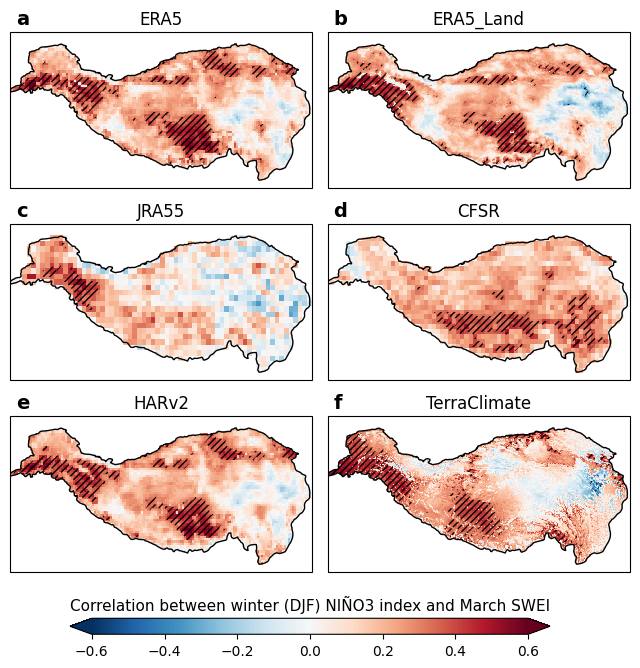

In [91]:
# plot the correlation between SWEI and NINO3 for ['ERA5','ERA5_Land','JRA55','CFSR','HARv2','TerraClimate']
fig = plt.figure(figsize=(8, 8))

for i, dn in enumerate(['ERA5','ERA5_Land','JRA55','CFSR','HARv2','TerraClimate']):
    ax = fig.add_subplot(3, 2, i+1, projection=ccrs.PlateCarree())
    ax.set_extent([68, 105, 25, 41], crs=ccrs.PlateCarree())
    plot_corr_SWEI_NINO3(dn,ax=ax)
    # add TP shapefile
    TP_shp.plot(ax=ax, edgecolor='black', facecolor='none')
    ax.set_title(dn)
    # add panel label
    add_panel_label(ax, 'abcdef'[i],x=0.02,y=1.15)
    # add colorbar in the bottom
    if i == 5:
        fig.subplots_adjust(bottom=0.2)
        cbar_ax = fig.add_axes([0.2, 0.125, 0.6, 0.02])
        fig.colorbar(ax.collections[0], cax=cbar_ax, orientation='horizontal', extend='both')
        # add title to the colorbar
        cbar_ax.set_title('Correlation between winter (DJF) NIÑO3 index and March SWEI',fontdict={'fontsize': 11})

# save the figure
fig.subplots_adjust(wspace=0.05, hspace=0.2)
plt.savefig('/Users/zeqinhuang/Documents/paper/TB_SWE/Figures/corr_SWEI_NINO3_reanalysis.png', dpi=300, bbox_inches='tight')
plt.savefig('/Users/zeqinhuang/Documents/paper/TB_SWE/Figures/corr_SWEI_NINO3_reanalysis.pdf', bbox_inches='tight')

In [38]:
ERA5_swei_year_ts, ERA5_swei_month_ts = cal_area_weighted_SWEI('ERA5')
ERA5_Land_swei_year_ts, ERA5_Land_swei_month_ts = cal_area_weighted_SWEI('ERA5_Land')
JRA55_swei_year_ts, JRA55_swei_month_ts = cal_area_weighted_SWEI('JRA55')
CFSR_swei_year_ts, CFSR_swei_month_ts = cal_area_weighted_SWEI('CFSR')
HARv2_swei_year_ts, HARv2_swei_month_ts = cal_area_weighted_SWEI('HARv2')
TerraClimate_swei_year_ts, TerraClimate_swei_month_ts = cal_area_weighted_SWEI('TerraClimate')

In [39]:
ERA5_swei_year_ts = pd.DataFrame(ERA5_swei_year_ts['swei'].data,index=pd.date_range('1979', '2022', freq='YS'))
ERA5_Land_swei_year_ts = pd.DataFrame(ERA5_Land_swei_year_ts['swei'].data,index=pd.date_range('1979', '2022', freq='YS'))
JRA55_swei_year_ts = pd.DataFrame(JRA55_swei_year_ts['swei'].data,index=pd.date_range('1979', '2022', freq='YS'))
CFSR_swei_year_ts = pd.DataFrame(CFSR_swei_year_ts['swei'].data,index=pd.date_range('1979', '2022', freq='YS'))
HARv2_swei_year_ts = pd.DataFrame(HARv2_swei_year_ts['swei'].data,index=pd.date_range('1980', '2021', freq='YS'))
TerraClimate_swei_year_ts = pd.DataFrame(TerraClimate_swei_year_ts['swei'].data,index=pd.date_range('1979', '2021', freq='YS'))

SWEI_year_ts = pd.concat([ERA5_swei_year_ts,ERA5_Land_swei_year_ts,JRA55_swei_year_ts,CFSR_swei_year_ts,HARv2_swei_year_ts,TerraClimate_swei_year_ts],axis=1)
SWEI_year_ts.columns = ['ERA5','ERA5-Land','JRA55','CFSR','HARv2','TerraClimate']

In [40]:
ERA5_swei_month_ts = pd.DataFrame(ERA5_swei_month_ts['swei'].data,index=pd.date_range('1979-09', '2023-08', freq='MS'))
ERA5_Land_swei_month_ts = pd.DataFrame(ERA5_Land_swei_month_ts['swei'].data,index=pd.date_range('1979-09', '2023-08', freq='MS'))
JRA55_swei_month_ts = pd.DataFrame(JRA55_swei_month_ts['swei'].data,index=pd.date_range('1979-09', '2023-08', freq='MS'))
CFSR_swei_month_ts = pd.DataFrame(CFSR_swei_month_ts['swei'].data,index=pd.date_range('1979-09', '2023-08', freq='MS'))
HARv2_swei_month_ts = pd.DataFrame(HARv2_swei_month_ts['swei'].data,index=pd.date_range('1980-09', '2022-08', freq='MS'))
TerraClimate_swei_month_ts = pd.DataFrame(TerraClimate_swei_month_ts['swei'].data,index=pd.date_range('1979-09', '2022-08', freq='MS'))

SWEI_month_ts = pd.concat([ERA5_swei_month_ts,ERA5_Land_swei_month_ts,JRA55_swei_month_ts,CFSR_swei_month_ts,HARv2_swei_month_ts,TerraClimate_swei_month_ts],axis=1)
SWEI_month_ts.columns = ['ERA5','ERA5-Land','JRA55','CFSR','HARv2','TerraClimate']

<AxesSubplot:>

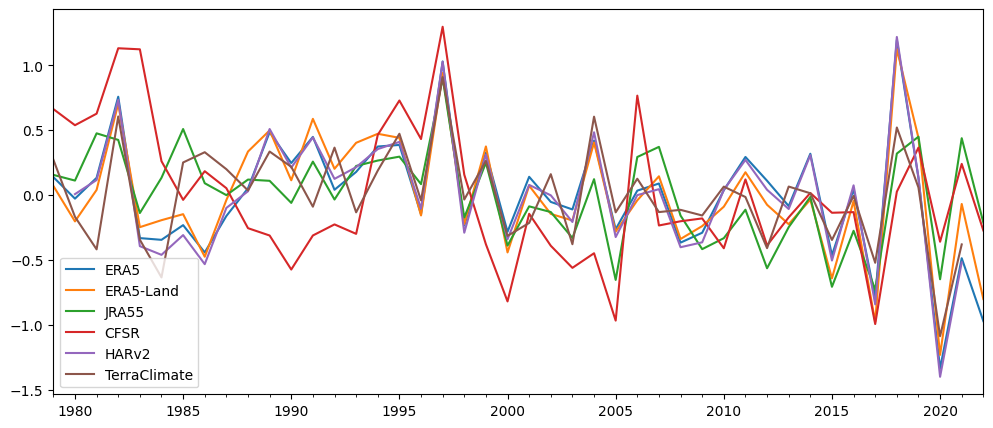

In [41]:
SWEI_year_ts.plot(figsize=(12, 5))

<AxesSubplot:>

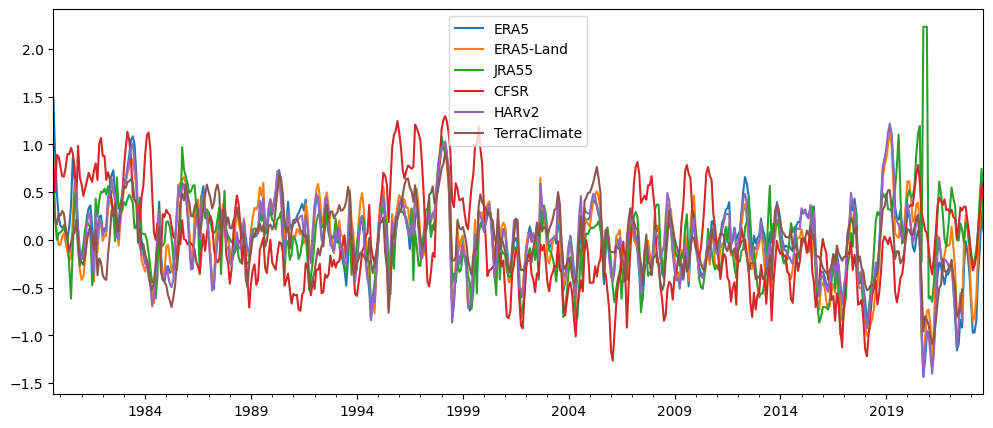

In [42]:
SWEI_month_ts.plot(figsize=(12, 5))

In [43]:
# define a function to plot the correlation between time series of SWEI
import seaborn as sns
from scipy.stats import pearsonr

class Pairs(object):
    def __init__(self, pdata: pd.DataFrame,
                 title: str = 'Here is the title',
                 figsize: tuple = (10, 5),
                 dpi: int = 100):

        if not isinstance(pdata, pd.DataFrame):
            raise ValueError("data must be a pd.DataFrame")

        pdata = pdata.select_dtypes(include=np.number)
        if pdata.shape[1] < 2:
            raise ValueError("data至少要有2列是数值型")

        self.figsize = figsize
        self.dpi = dpi
        self.title = title

        self.rawdata = pdata
        self.num_rol = self.rawdata.shape[1]
        self.data_col_name = self.rawdata.columns.tolist()

        self.cor_bbox_props = dict(boxstyle="round", fc="w", ec="0.5", alpha=0.9)
        self.title_bbox_props = dict(boxstyle="round", fc="w", ec="0.5", alpha=0.2)

    def pairs(self):
        fig, ax = plt.subplots(ncols=self.num_rol,
                               nrows=self.num_rol,
                               figsize=self.figsize,
                               dpi=self.dpi)

        for temp_col in range(self.num_rol):
            for temp_row in range(self.num_rol):

                if temp_row == temp_col:
                    # plot 主对角线
                    sns.histplot(data=self.rawdata,
                                 x=self.data_col_name[temp_col],
                                 bins=10,alpha=1,
                                 ax=ax[temp_row, temp_col])
                    ax[temp_row, temp_col].set(xlabel=None)
                    ax[temp_row, temp_col].set(ylabel=None)
                    ax[temp_row, temp_col].annotate(self.data_col_name[temp_col],
                                                    xy=(0.5, 0.85),
                                                    size=8,
                                                    color = 'red',
                                                    ha='center',
                                                    bbox=self.title_bbox_props,
                                                    xycoords="axes fraction")
                    ax[temp_row, temp_col].grid(axis='x')
                    ax[temp_row, temp_col].tick_params(axis='both', which='major', labelsize=6.5)
                elif temp_row > temp_col:
                    # 下对角线
                    ax[temp_row, temp_col].grid(False)
                    sns.scatterplot(data=self.rawdata,
                                    x=self.data_col_name[temp_col],
                                    y=self.data_col_name[temp_row],
                                    color='black',
                                    s = 5,
                                    ax=ax[temp_row, temp_col])
                    # ax[temp_row, temp_col].set_yticks([])
                    ax[temp_row, temp_col].set(xlabel=None)
                    ax[temp_row, temp_col].set(ylabel=None)
                    ax[temp_row, temp_col].tick_params(axis='both', which='major', labelsize=5)

                elif temp_row < temp_col:
                    # 上对角线
                    ax[temp_row, temp_col].axis([0, 1, 0, 1])
                    cor_value, p_value = pearsonr(x=self.rawdata[self.data_col_name[temp_col]],
                                                  y=self.rawdata[self.data_col_name[temp_row]])
                    cor_value = np.around(cor_value, 5)
                    # 0 ‘***’ 0.001 ‘**’ 0.01 ‘*’ 0.05 ‘.’ 0.1 ‘ ’ 1
                    if 0 <= p_value < 0.001:
                        show_p_value = "***"
                    elif 0.001 <= p_value < 0.01:
                        show_p_value = "**"
                    elif 0.01 <= p_value < 0.05:
                        show_p_value = "*"
                    elif 0.05 <= p_value < 0.1:
                        show_p_value = "."
                    elif 0.1 <= p_value <= 1:
                        show_p_value = " "
                    else:
                        show_p_value = " "

                    ax[temp_row, temp_col].text(0.5, 0.5, f"{cor_value:.2f}",ha='center',) # bbox=self.cor_bbox_props
                    ax[temp_row, temp_col].text(0.5, 0.3, f"{show_p_value:^3}", color='red',ha='center',
                                                ) #bbox=self.cor_bbox_props
                    ax[temp_row, temp_col].set_xticks([])
                    ax[temp_row, temp_col].set_yticks([])
                    ax[temp_row, temp_col].tick_params(axis='both', which='major', labelsize=5)

                # remove duplicates xticks and xlabel
                if temp_row != self.num_rol - 1:
                    ax[temp_row, temp_col].set_xticks([])
                    ax[temp_row, temp_col].set(xlabel=None)

                if temp_row > temp_col and temp_col != 0:
                    ax[temp_row, temp_col].set(ylabel=None)
                    ax[temp_row, temp_col].set_yticks([])
        fig.suptitle(self.title)
        fig.tight_layout()
        return fig, ax

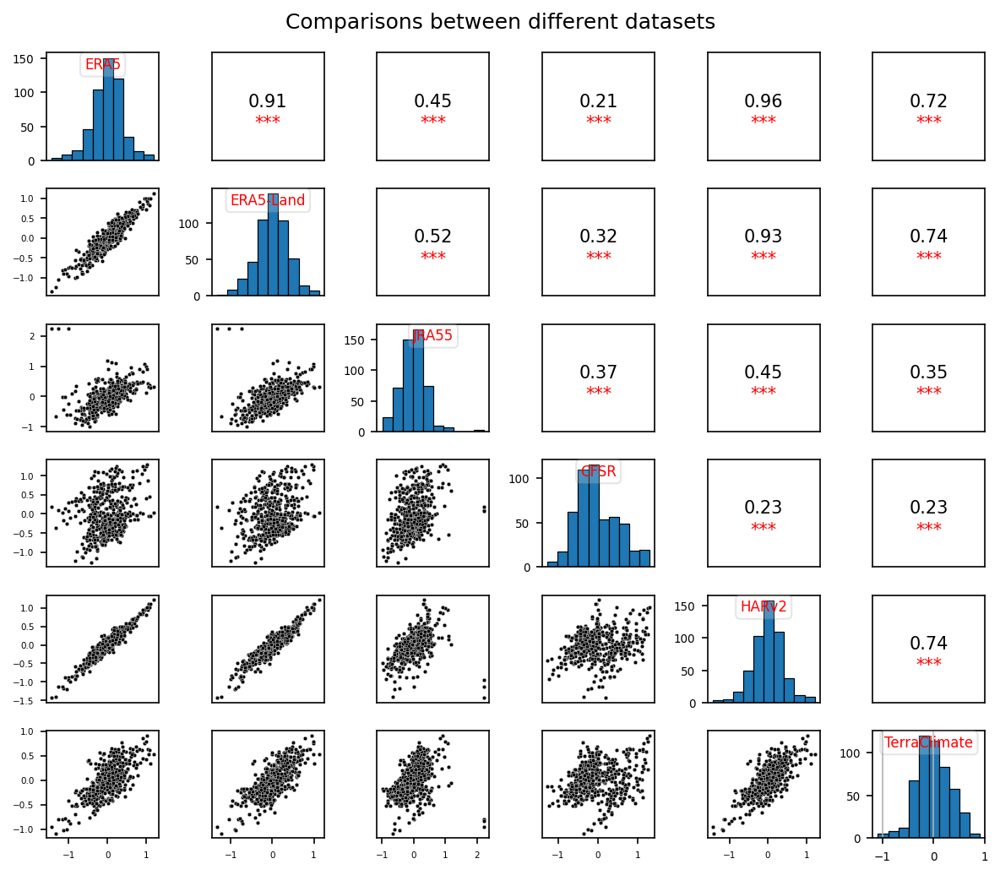

In [80]:
p = Pairs(pdata=SWEI_month_ts.dropna(axis=0, how='any'), figsize=(8, 7), dpi=150,title='Comparisons between different datasets')
fig, ax = p.pairs()

fig.savefig('/Users/zeqinhuang/Documents/paper/TB_SWE/Figures/SWEI_correlation_monthly.png', dpi=300, bbox_inches='tight')
fig.savefig('/Users/zeqinhuang/Documents/paper/TB_SWE/Figures/SWEI_correlation_monthly.pdf', bbox_inches='tight')

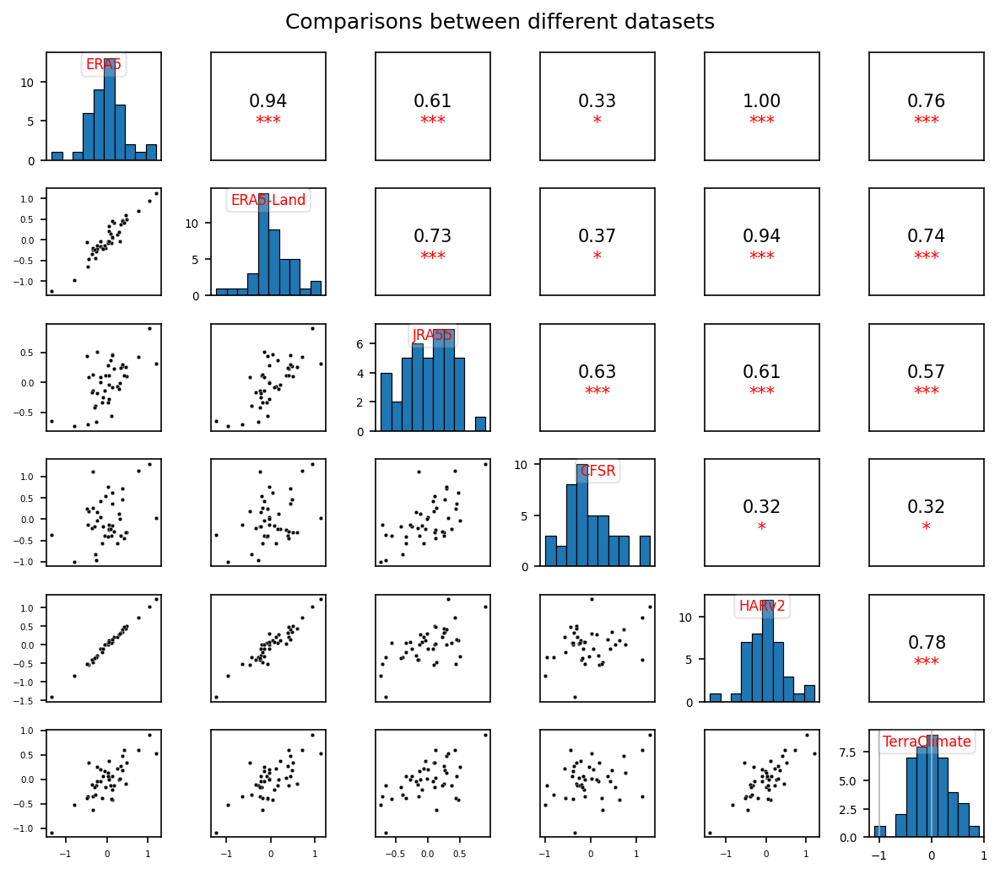

In [79]:
p = Pairs(pdata=SWEI_year_ts.dropna(axis=0, how='any'), figsize=(8, 7), dpi=150,title='Comparisons between different datasets')
fig, ax = p.pairs()

fig.savefig('/Users/zeqinhuang/Documents/paper/TB_SWE/Figures/SWEI_correlation_yearly.png', dpi=300, bbox_inches='tight')
fig.savefig('/Users/zeqinhuang/Documents/paper/TB_SWE/Figures/SWEI_correlation_yearly.pdf', bbox_inches='tight')

In [46]:
# calculate the correlation between SWEI and NINO34
NINO34_QS = NINO34.resample('QS-DEC').mean()
NINO34_QS_DJF = NINO34_QS[NINO34_QS.index.month == 12]
NINO34_QS_DJF = NINO34_QS_DJF[1:]
NINO34_QS_DJF.index = SWEI_year_ts.index
# correlation between SWEI_year_ts and NINO34_QS_DJF
SWEI_year_ts.corrwith(NINO34_QS_DJF,axis=0)

ERA5            0.388354
ERA5-Land       0.321163
JRA55           0.205048
CFSR            0.331243
HARv2           0.372302
TerraClimate    0.406970
dtype: float64

In [47]:
# calculate the correlation between SWEI and NINO3
NINO3_QS = NINO3.resample('QS-DEC').mean()
NINO3_QS_DJF = NINO3_QS[NINO3_QS.index.month == 12]
NINO3_QS_DJF = NINO3_QS_DJF[1:]
NINO3_QS_DJF.index = SWEI_year_ts.index
# correlation between SWEI_year_ts and NINO3_QS_DJF
# SWEI_year_ts.corrwith(NINO3_QS_DJF,axis=0)
# pvalue between SWEI_year_ts and NINO3_QS_DJF
from scipy.stats import pearsonr
print('ERA5:',pearsonr(SWEI_year_ts['ERA5'],NINO3_QS_DJF))
print('ERA5-Land:',pearsonr(SWEI_year_ts['ERA5-Land'],NINO3_QS_DJF))
print('JRA55:',pearsonr(SWEI_year_ts['JRA55'],NINO3_QS_DJF))
print('CFSR:',pearsonr(SWEI_year_ts['CFSR'],NINO3_QS_DJF))
print('HARv2:',pearsonr(SWEI_year_ts['HARv2'][1:-1],NINO3_QS_DJF[1:-1]))
print('TerraClimate:',pearsonr(SWEI_year_ts['TerraClimate'][:-1],NINO3_QS_DJF[:-1]))

ERA5: PearsonRResult(statistic=0.42483618210377, pvalue=0.004047112483574579)
ERA5-Land: PearsonRResult(statistic=0.3507066042323408, pvalue=0.019594268943291297)
JRA55: PearsonRResult(statistic=0.23674183687407305, pvalue=0.12180368895824684)
CFSR: PearsonRResult(statistic=0.41006115813604593, pvalue=0.00570166399457113)
HARv2: PearsonRResult(statistic=0.40505631459459884, pvalue=0.0077916649216227775)
TerraClimate: PearsonRResult(statistic=0.4343946768995389, pvalue=0.0036072282944892417)


No handles with labels found to put in legend.


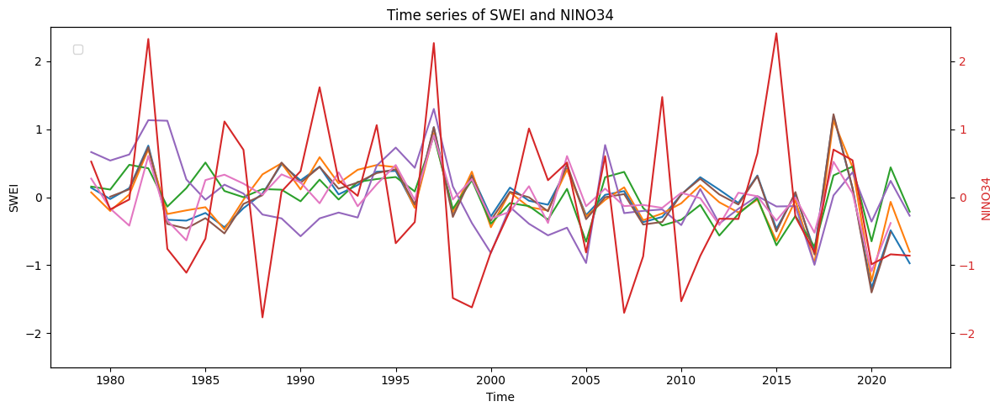

In [48]:
# plot time series of SWEI_year_ts and NINO34_QS_DJF
# SWEI_year_ts for the main y axis and NINO34_QS_DJF for the second y axis
fig, ax1 = plt.subplots(figsize=(12, 5))
colors = ['tab:blue','tab:orange','tab:green','tab:purple','tab:brown','tab:pink']
ax1.set_xlabel('Time')
ax1.set_ylabel('SWEI')
ax1.plot(SWEI_year_ts['ERA5'], color=colors[0])
ax1.plot(SWEI_year_ts['ERA5-Land'], color=colors[1])
ax1.plot(SWEI_year_ts['JRA55'], color=colors[2])
ax1.plot(SWEI_year_ts['CFSR'], color=colors[3])
ax1.plot(SWEI_year_ts['HARv2'], color=colors[4])
ax1.plot(SWEI_year_ts['TerraClimate'], color=colors[5])
ax1.tick_params(axis='y')
ax1.set_ylim(-2.5,2.5)
ax1.set_title('Time series of SWEI and NINO34')
ax1.legend(bbox_to_anchor=(0.025, 0.95), loc='upper left', borderaxespad=0., ncol=4)

ax2 = ax1.twinx()  # instantiate a second axes that shares the same x-axis
color = 'tab:red'
ax2.set_ylabel('NINO34', color=color)  # we already handled the x-label with ax1
ax2.plot(NINO34_QS_DJF, color=color)
ax2.tick_params(axis='y', labelcolor=color)
ax2.set_ylim(-2.5,2.5)

fig.tight_layout()  # otherwise the right y-label is slightly clipped

# fig = plt.figure(figsize=(12, 5))
# SWEI_year_ts.plot()
# NINO34_QS_DJF.plot()
# plt.legend(bbox_to_anchor=(0.025, 0.95), loc='upper left', borderaxespad=0., ncol=4)


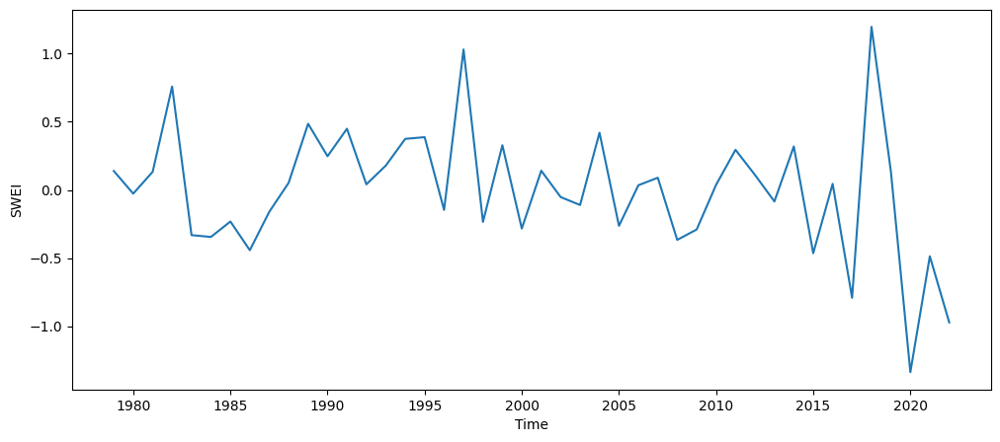

In [49]:
fig, ax1 = plt.subplots(figsize=(12, 5))
colors = ['tab:blue','tab:orange','tab:green','tab:purple','tab:brown','tab:pink']
ax1.set_xlabel('Time')
ax1.set_ylabel('SWEI')
ax1.plot(SWEI_year_ts['ERA5'], color=colors[0])

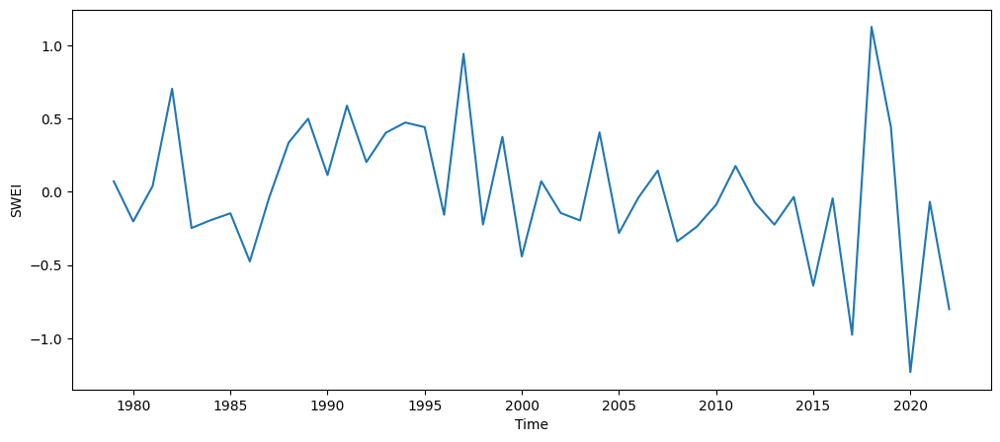

In [50]:
fig, ax1 = plt.subplots(figsize=(12, 5))
colors = ['tab:blue','tab:orange','tab:green','tab:purple','tab:brown','tab:pink']
ax1.set_xlabel('Time')
ax1.set_ylabel('SWEI')
ax1.plot(SWEI_year_ts['ERA5-Land'], color=colors[0])

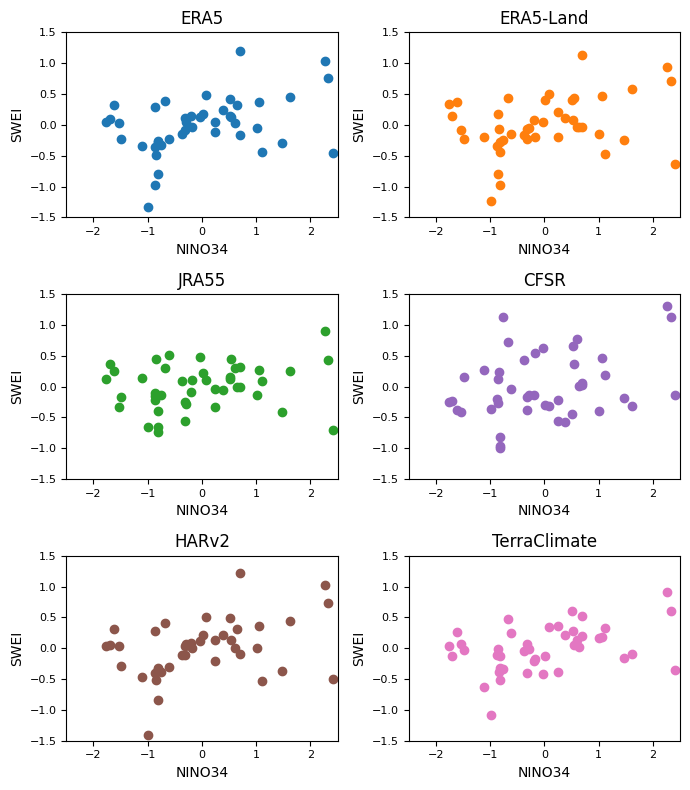

In [51]:
# 3*2 scatter plot of NINO34_QS_DJF and SWEI_year_ts
fig = plt.figure(figsize=(7, 8))
colors = ['tab:blue','tab:orange','tab:green','tab:purple','tab:brown','tab:pink']
for i in range(6):
    ax = fig.add_subplot(3, 2, i+1)
    ax.scatter(NINO34_QS_DJF,SWEI_year_ts.iloc[:,i],color=colors[i])
    ax.set_xlabel('NINO34')
    ax.set_ylabel('SWEI')
    ax.set_title(SWEI_year_ts.columns[i])
    ax.set_ylim(-1.5,1.5)
    ax.set_xlim(-2.5,2.5)
    ax.tick_params(axis='both', which='major', labelsize=8)

# tight layout
fig.tight_layout()


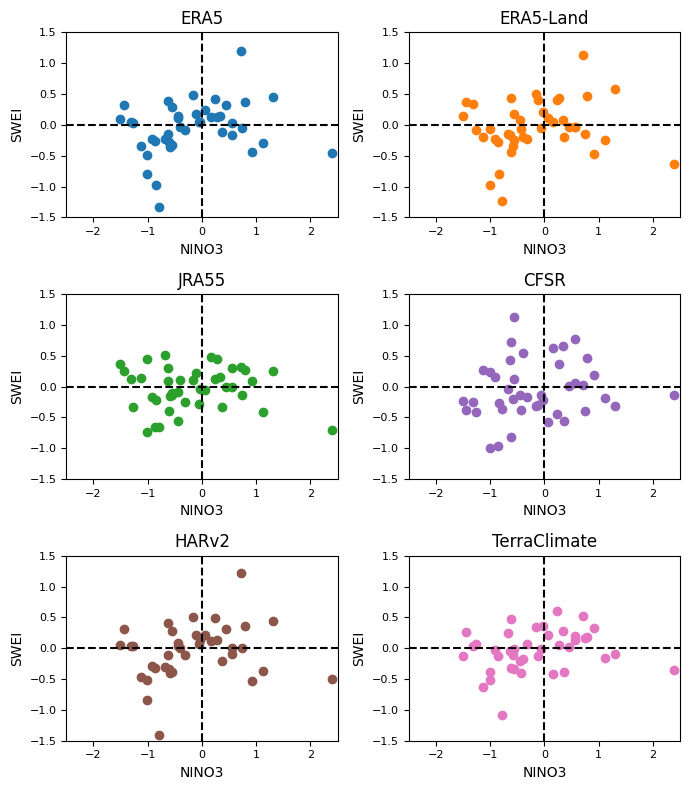

In [52]:
# 3*2 scatter plot of NINO3_QS_DJF and SWEI_year_ts
fig = plt.figure(figsize=(7, 8))
colors = ['tab:blue','tab:orange','tab:green','tab:purple','tab:brown','tab:pink']
for i in range(6):
    ax = fig.add_subplot(3, 2, i+1)
    ax.scatter(NINO3_QS_DJF,SWEI_year_ts.iloc[:,i],color=colors[i])
    ax.set_xlabel('NINO3')
    ax.set_ylabel('SWEI')
    ax.set_title(SWEI_year_ts.columns[i])
    ax.set_ylim(-1.5,1.5)
    ax.set_xlim(-2.5,2.5)
    ax.tick_params(axis='both', which='major', labelsize=8)
    # add dashed lines at x=0 and y=0
    ax.axvline(x=0, color='black', linestyle='--')
    ax.axhline(y=0, color='black', linestyle='--')

# tight layout
fig.tight_layout()


No handles with labels found to put in legend.


No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


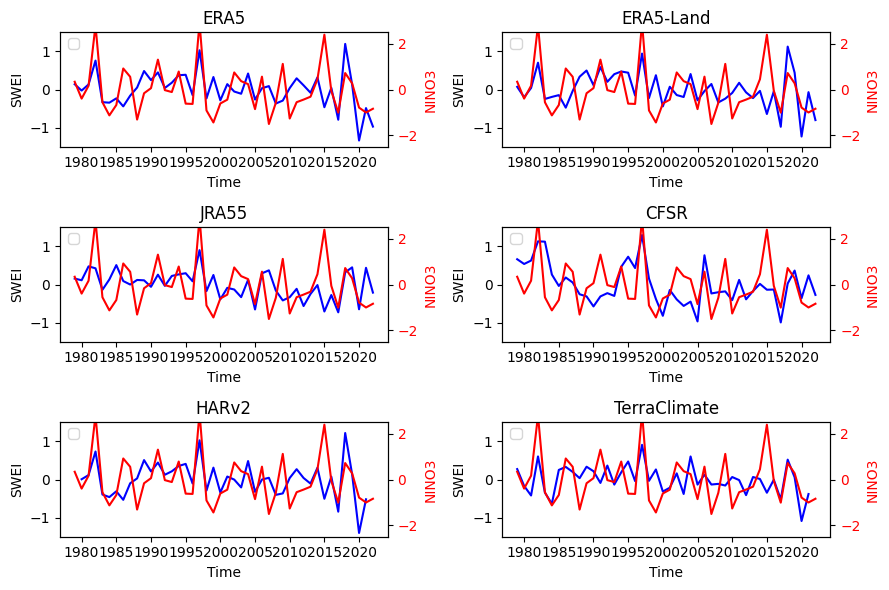

In [76]:
# 3*2 line plot of NINO3_QS_DJF and SWEI_year_ts with 2 y axis
fig = plt.figure(figsize=(9, 6))
for i in range(6):
    ax1 = fig.add_subplot(3, 2, i+1)
    ax1.set_xlabel('Time')
    ax1.set_ylabel('SWEI')
    ax1.plot(SWEI_year_ts.iloc[:,i], color='blue')
    ax1.tick_params(axis='y')
    ax1.set_ylim(-1.5,1.5)
    ax1.set_title(SWEI_year_ts.columns[i])
    ax1.legend(bbox_to_anchor=(0.025, 0.95), loc='upper left', borderaxespad=0., ncol=4)

    ax2 = ax1.twinx()  # instantiate a second axes that shares the same x-axis
    ax2.set_ylabel('NINO3', color='red')  # we already handled the x-label with ax1
    ax2.plot(NINO3_QS_DJF, color='red')
    ax2.tick_params(axis='y', labelcolor='red')
    ax2.set_ylim(-2.5,2.5)

fig.tight_layout()  # otherwise the right y-label is slightly clipped


In [78]:
SWEI_year_ts.to_csv('/Users/zeqinhuang/Documents/paper/TB_SWE/processed_data/SWEI_year_ts.csv')
SWEI_month_ts.to_csv('/Users/zeqinhuang/Documents/paper/TB_SWE/processed_data/SWEI_month_ts.csv')

# plot composite maps of SWEI for El Niño and La Niña years

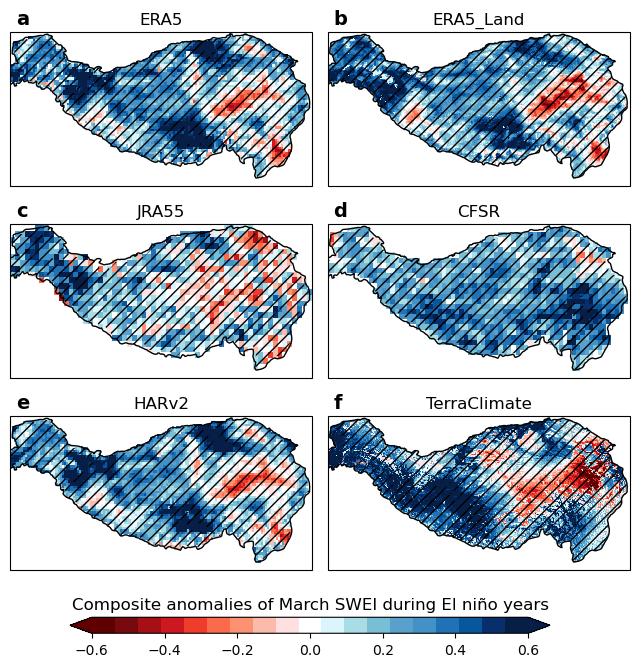

In [9]:
# plot composite maps of SWEI for El Niño
fig = plt.figure(figsize=(8, 8))
for i, dn in enumerate(['ERA5','ERA5_Land','JRA55','CFSR','HARv2','TerraClimate']):
    ax = fig.add_subplot(3, 2, i+1, projection=ccrs.PlateCarree())
    ax.set_extent([70, 105, 25, 40], crs=ccrs.PlateCarree())
    plot_SWEI_ano_NINO(dn,ax=ax)
    # add TP shapefile
    TP_shp.plot(ax=ax, edgecolor='black', facecolor='none')
    ax.set_title(dn)
    # add panel label
    add_panel_label(ax, 'abcdef'[i],x=0.02,y=1.15)
    # add colorbar in the bottom
    if i == 5:
        fig.subplots_adjust(bottom=0.2)
        cbar_ax = fig.add_axes([0.2, 0.125, 0.6, 0.02])
        fig.colorbar(ax.collections[0], cax=cbar_ax, orientation='horizontal', extend='both')
        # add title to the colorbar
        cbar_ax.set_title('Composite anomalies of March SWEI during El niño years')

# save the figure
fig.subplots_adjust(wspace=0.05, hspace=0.2)
plt.savefig('/Users/zeqinhuang/Documents/paper/TB_SWE/Figures/SWEI_ano_NINO_reanalysis.png', dpi=300, bbox_inches='tight')
plt.savefig('/Users/zeqinhuang/Documents/paper/TB_SWE/Figures/SWEI_ano_NINO_reanalysis.pdf', bbox_inches='tight')

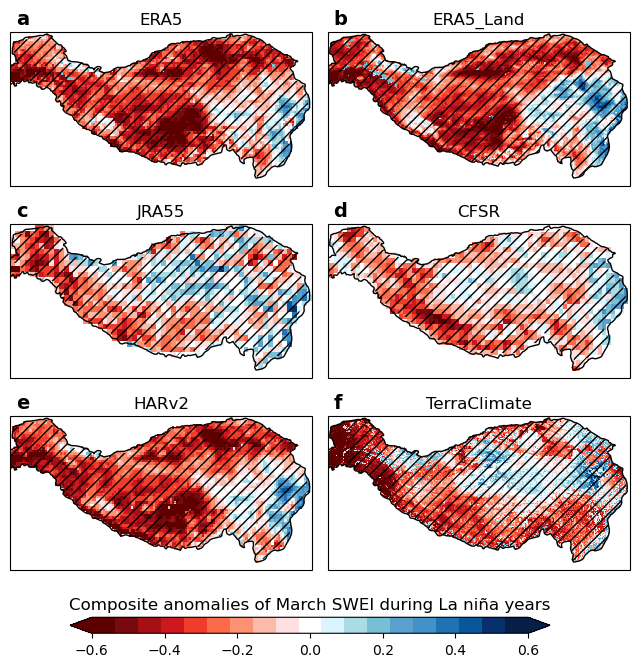

In [12]:
# plot composite maps of SWEI for La Niña years
fig = plt.figure(figsize=(8, 8))
for i, dn in enumerate(['ERA5','ERA5_Land','JRA55','CFSR','HARv2','TerraClimate']):
    ax = fig.add_subplot(3, 2, i+1, projection=ccrs.PlateCarree())
    ax.set_extent([70, 105, 25, 40], crs=ccrs.PlateCarree())
    plot_SWEI_ano_NINA(dn,ax=ax)
    # add TP shapefile
    TP_shp.plot(ax=ax, edgecolor='black', facecolor='none')
    ax.set_title(dn)
    # add panel label
    add_panel_label(ax, 'abcdef'[i],x=0.02,y=1.15)
    # add colorbar in the bottom
    if i == 5:
        fig.subplots_adjust(bottom=0.2)
        cbar_ax = fig.add_axes([0.2, 0.125, 0.6, 0.02])
        fig.colorbar(ax.collections[0], cax=cbar_ax, orientation='horizontal', extend='both')
        # add title to the colorbar
        cbar_ax.set_title('Composite anomalies of March SWEI during La niña years')
        
# save the figure
fig.subplots_adjust(wspace=0.05, hspace=0.2)
plt.savefig('/Users/zeqinhuang/Documents/paper/TB_SWE/Figures/SWEI_ano_NINA_reanalysis.png', dpi=300, bbox_inches='tight')
plt.savefig('/Users/zeqinhuang/Documents/paper/TB_SWE/Figures/SWEI_ano_NINA_reanalysis.pdf', bbox_inches='tight')

In [126]:
# save ds_swei_NINA_mean, ttest_res_NINA_pvalue to netcdf
for dn in ['ERA5','ERA5_Land','JRA55','CFSR','HARv2','TerraClimate']:
    ds_swei_NINA_mean, ttest_res_NINA_pvalue = cal_SWEI_ano_NINA(dn)
    ds_swei_NINA_mean = ds_swei_NINA_mean.rename({'swei':'SWEI_NINA_mean'})
    ds_swei_NINA_mean.to_netcdf(f'/Users/zeqinhuang/Documents/paper/TB_SWE/processed_data/SWEI_NINA_composite_mean_{dn}.nc')
    ttest_res_NINA_pvalue.name = 'SWEI_NINA_ttest_p'
    ttest_res_NINA_pvalue.to_netcdf(f'/Users/zeqinhuang/Documents/paper/TB_SWE/processed_data/SWEI_NINA_composite_mean_ttest_p_{dn}.nc')

# save ds_swei_NINO_mean, ttest_res_NINO_pvalue to netcdf
for dn in ['ERA5','ERA5_Land','JRA55','CFSR','HARv2','TerraClimate']:
    ds_swei_NINO_mean, ttest_res_NINO_pvalue = cal_SWEI_ano_NINO(dn)
    ds_swei_NINO_mean = ds_swei_NINO_mean.rename({'swei':'SWEI_NINO_mean'})
    ds_swei_NINO_mean.to_netcdf(f'/Users/zeqinhuang/Documents/paper/TB_SWE/processed_data/SWEI_NINO_composite_mean_{dn}.nc')
    ttest_res_NINO_pvalue.name = 'SWEI_NINO_ttest_p'
    ttest_res_NINO_pvalue.to_netcdf(f'/Users/zeqinhuang/Documents/paper/TB_SWE/processed_data/SWEI_NINO_composite_mean_ttest_p_{dn}.nc')